_In the Credit data in the ISLR package it contains 400 customers and information on their credit history. For full information of the data look at the help file. A company has approached us to better understand factors that influence the Balance variable which is average credit card balance in USD. Using the information in the model discuss the influential factors, and discuss the factors you choose to put in the model. Do you have any concerns about the use of certain variables in the model? Discuss how your model was created and any insights you can provide based on the results. HINT: Adding Gender and/or Ethnicity could be controversial or illegal in some uses of this this model you should discuss your decision on these variables and how it effects the organizations ability to use your model for prediction or inference_

To get a better understanding of the features that influence the average credit card balance, we will explore various modeling methods as well as how they impact the variables we are working with. Since our primary focus in this section is inference, the need for any prediction accuracy metric is not needed for what we are doing. We will begin by doing our usual exploratory data analysis.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import scipy.stats
from statsmodels.stats.diagnostic import linear_reset, het_breuschpagan as bptest
from statsmodels.stats.outliers_influence import OLSInfluence, variance_inflation_factor
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.anova import anova_lm
from statsmodels.genmod.families import Tweedie
from statsmodels.genmod.families.links import Log 
from scipy.stats import t
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.preprocessing import PowerTransformer, PolynomialFeatures, StandardScaler
from sklearn.linear_model import LassoCV, ElasticNetCV, LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, mean_squared_error, brier_score_loss
from sklearn.calibration import calibration_curve
from stepwise_utils import stepwise_aic
import rpowertransform 
from rpowertransform.multivariate import MultivariatePowerTransform
from patsy import dmatrix

Credit = pd.read_csv("https://raw.githubusercontent.com/JWarmenhoven/ISLR-python/master/Notebooks/Data/Credit.csv")
Credit["Balance_plus"] = Credit["Balance"] + 10
Credit["Balance_log"] = np.log(Credit["Balance_plus"])
Credit["Balance_sqrt"] = np.sqrt(Credit["Balance"])
Credit['Education_t'] = pd.cut(Credit["Education"], bins = [5, 13, 21], labels = ['low education', 'high education'], right = False)
Credit["Education"] = Credit["Education_t"].astype("category")
Credit["Gender"] = Credit["Gender"].astype("category")
Credit["Student"] = Credit["Student"].astype("category")
Credit["Married"] = Credit["Married"].astype("category")
Credit["Ethnicity"] = Credit["Ethnicity"].astype("category")
print(Credit.head())

   Unnamed: 0   Income  Limit  Rating  Cards  Age       Education  Gender  \
0           1   14.891   3606     283      2   34   low education    Male   
1           2  106.025   6645     483      3   82  high education  Female   
2           3  104.593   7075     514      4   71   low education    Male   
3           4  148.924   9504     681      3   36   low education  Female   
4           5   55.882   4897     357      2   68  high education    Male   

  Student Married  Ethnicity  Balance  Balance_plus  Balance_log  \
0      No     Yes  Caucasian      333           343     5.837730   
1     Yes     Yes      Asian      903           913     6.816736   
2      No      No      Asian      580           590     6.380123   
3      No      No      Asian      964           974     6.881411   
4      No     Yes  Caucasian      331           341     5.831882   

   Balance_sqrt     Education_t  
0     18.248288   low education  
1     30.049958  high education  
2     24.083189   low educ

In [2]:
print(Credit.describe(include="all"))

        Unnamed: 0      Income         Limit      Rating       Cards  \
count   400.000000  400.000000    400.000000  400.000000  400.000000   
unique         NaN         NaN           NaN         NaN         NaN   
top            NaN         NaN           NaN         NaN         NaN   
freq           NaN         NaN           NaN         NaN         NaN   
mean    200.500000   45.218885   4735.600000  354.940000    2.957500   
std     115.614301   35.244273   2308.198848  154.724143    1.371275   
min       1.000000   10.354000    855.000000   93.000000    1.000000   
25%     100.750000   21.007250   3088.000000  247.250000    2.000000   
50%     200.500000   33.115500   4622.500000  344.000000    3.000000   
75%     300.250000   57.470750   5872.750000  437.250000    4.000000   
max     400.000000  186.634000  13913.000000  982.000000    9.000000   

               Age       Education  Gender Student Married  Ethnicity  \
count   400.000000             400     400     400     400    

We see we are working with a dataset of about 400 observations and 12 variables. Immediately we can see that certain variables may be due for some transformation. Since our response is Balance, that seems to go over several orders of magnitude. It also contains zeros. We will probably have to do a log transformation with this one, but before we do, we had to make sure we cover for any 0's by creating another column, "Balance_plus", as well as "Balance_log".

Now we can begin to actually fit our model. We will start by fitting almost all of the variables without the need of doing any type of transformation. Balance will be our response variable with everything else as our predictors.

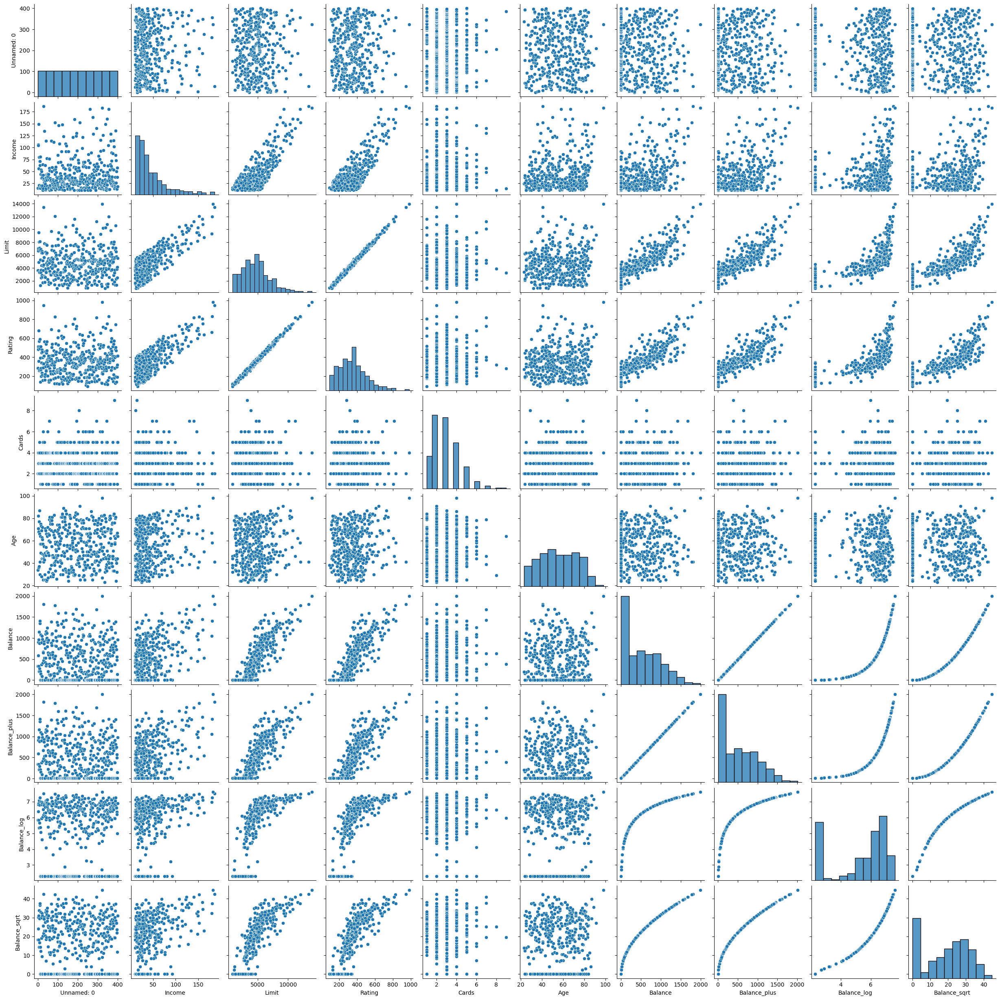

In [3]:
sns.pairplot(Credit)
plt.show()

In [4]:
creditm1 = smf.ols("Balance~Income+Limit+Rating+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data=Credit).fit()
print(creditm1.summary())

                            OLS Regression Results                            
Dep. Variable:                Balance   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     749.4
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          1.40e-253
Time:                        20:18:21   Log-Likelihood:                -2398.9
No. Observations:                 400   AIC:                             4822.
Df Residuals:                     388   BIC:                             4870.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

We now have a fit. We see a lot of insignificance, especially between levels of certain factors, however before we do any type of interpretation, it is best that we check that our assumptions have been met. 

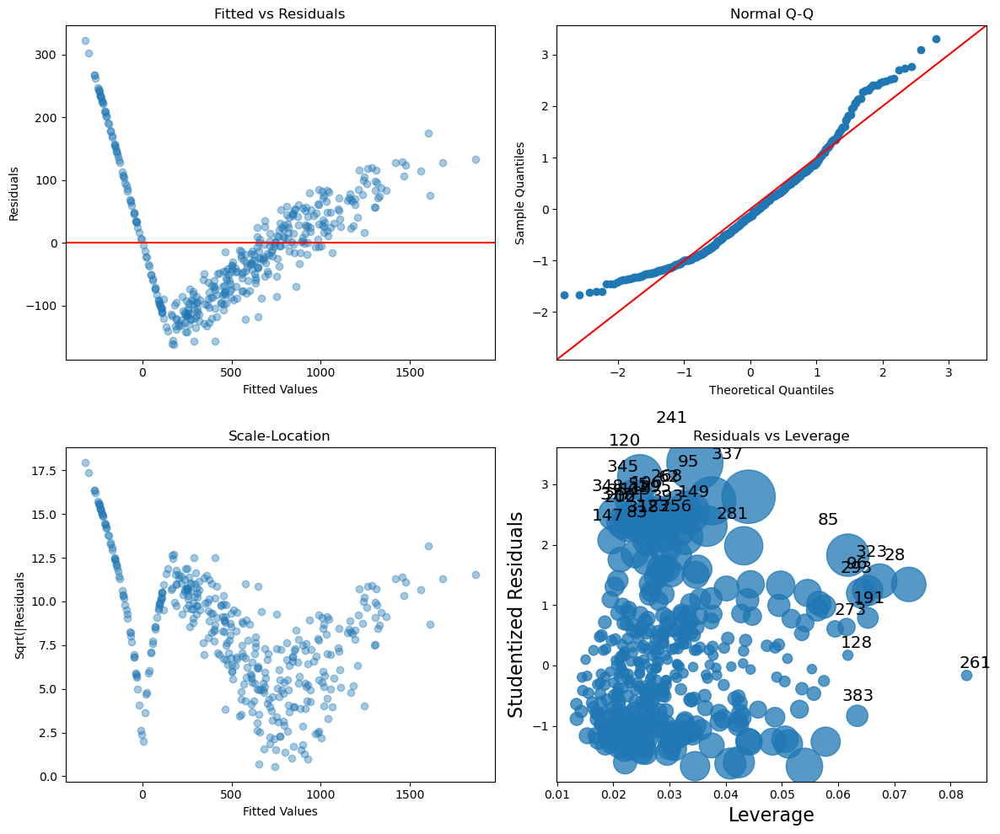

In [5]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(creditm1.fittedvalues, creditm1.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Fitted vs Residuals")
sm.qqplot(creditm1.get_influence().resid_studentized_internal, line = "45", ax=axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(creditm1.fittedvalues, np.sqrt(np.abs(creditm1.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(creditm1, ax=axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

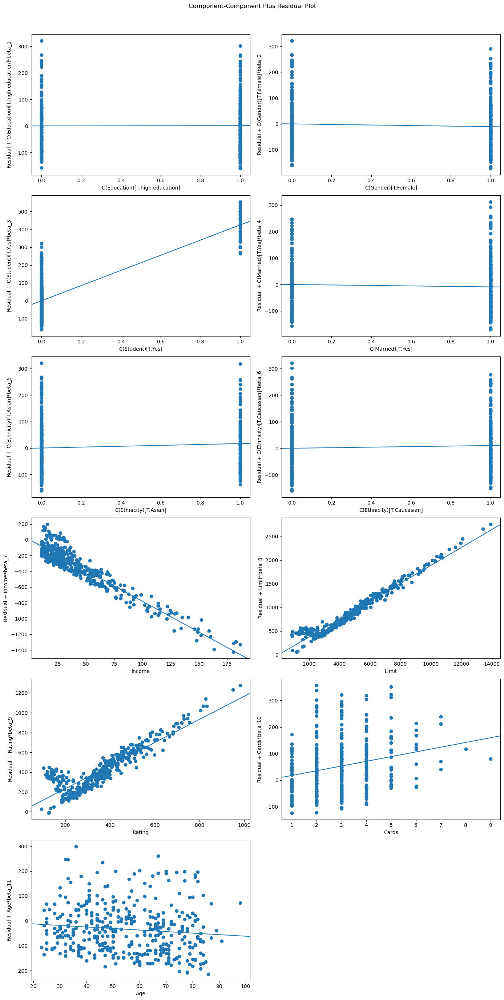

<F test: F=np.float64(33.61942753280356), p=2.6930169185922247e-43, df_denom=378, df_num=9>
<F test: F=1777.4259881794837, p=1.8300213664403278e-195, df_denom=386, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  warnings.warn('covariance of constraints does not have full '


In [6]:
fig = sm.graphics.plot_ccpr_grid(creditm1, fig = plt.figure(figsize = (14,28)))
plt.show()

print(linear_reset(creditm1, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(creditm1, power = [2,3], test_type = 'fitted', use_f = True))

In [7]:
creditbp = bptest(creditm1.resid, creditm1.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, creditbp):
    print(f"{stat}:{score}")

BP statistic:132.02676218165297
BP p-value:6.767110590391507e-23
f-value:17.378392010516755
f p-value:5.106553252946853e-28


In [8]:
X = creditm1.model.exog
vif = pd.DataFrame({"Variables": creditm1.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})

print(vif[vif["VIF"] >= 10])

   Variables         VIF
0  Intercept   34.387115
8      Limit  233.286723
9     Rating  235.219326


In [9]:
rstudent = OLSInfluence(creditm1).resid_studentized_external
df = creditm1.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
241,3.356613,0.000867,0.346786
120,3.123692,0.001920,0.768038
0,-0.842411,0.400077,1.000000
271,-0.416592,0.677207,1.000000
270,-0.879042,0.379922,1.000000
269,0.096807,0.922929,1.000000
268,2.559724,0.010854,1.000000
267,0.288056,0.773458,1.000000
266,-1.667917,0.096139,1.000000
265,-0.325386,0.745064,1.000000


In [10]:
print(creditm1.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
241  0.034540  0.032724        3.313065
337  0.044081  0.029484        2.769930
95   0.037545  0.023772        2.704215
120  0.024740  0.020172        3.089026
62   0.033369  0.018272        2.520240
85   0.061749  0.018182        1.820780
268  0.031895  0.017735        2.541603
149  0.036650  0.016700        2.295134
345  0.023763  0.015153        2.733186
281  0.043221  0.014671        1.974153


In [11]:
print(anova_lm(creditm1, type = 2))

                 df        sum_sq       mean_sq            F         PR(>F)
C(Education)    1.0  1.164018e+05  1.164018e+05    11.912697   6.188493e-04
C(Gender)       1.0  3.899324e+04  3.899324e+04     3.990613   4.645215e-02
C(Student)      1.0  5.751555e+06  5.751555e+06   588.620676   8.769725e-80
C(Married)      1.0  1.911647e+04  1.911647e+04     1.956402   1.626975e-01
C(Ethnicity)    2.0  5.033680e+04  2.516840e+04     2.575763   7.739652e-02
Income          1.0  1.760557e+07  1.760557e+07  1801.774538  7.002051e-148
Limit           1.0  5.647411e+07  5.647411e+07  5779.624978  3.730350e-235
Rating          1.0  2.925387e+05  2.925387e+05    29.938750   8.012876e-08
Cards           1.0  1.569177e+05  1.569177e+05    16.059137   7.361861e-05
Age             1.0  4.312886e+04  4.312886e+04     4.413857   3.629281e-02
Residual      388.0  3.791242e+06  9.771241e+03          NaN            NaN


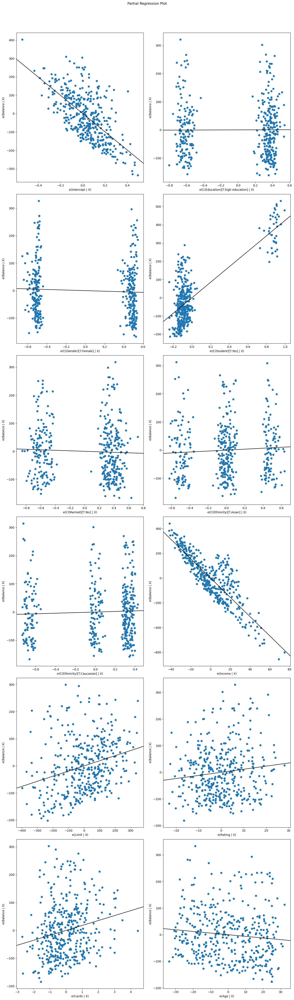

In [12]:
fig = sm.graphics.plot_partregress_grid(creditm1, fig = plt.figure(figsize = (14,48)))
plt.show()

We see that we have pretty much violated almost all of our assumptions. We have heteroskedasticity, no linearity, multicollinearity, no normality of errors, etc. Before we try to fix this one model, we can see what transformations of the response does. We can try a square root transformation, a quadratic transformation, and a log transformation.

In [13]:
creditm2 = smf.ols("np.sqrt(Balance)~Income+Limit+Rating+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = Credit).fit()
print(creditm2.summary())

                            OLS Regression Results                            
Dep. Variable:       np.sqrt(Balance)   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     743.4
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          6.24e-253
Time:                        20:18:28   Log-Likelihood:                -966.31
No. Observations:                 400   AIC:                             1957.
Df Residuals:                     388   BIC:                             2005.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

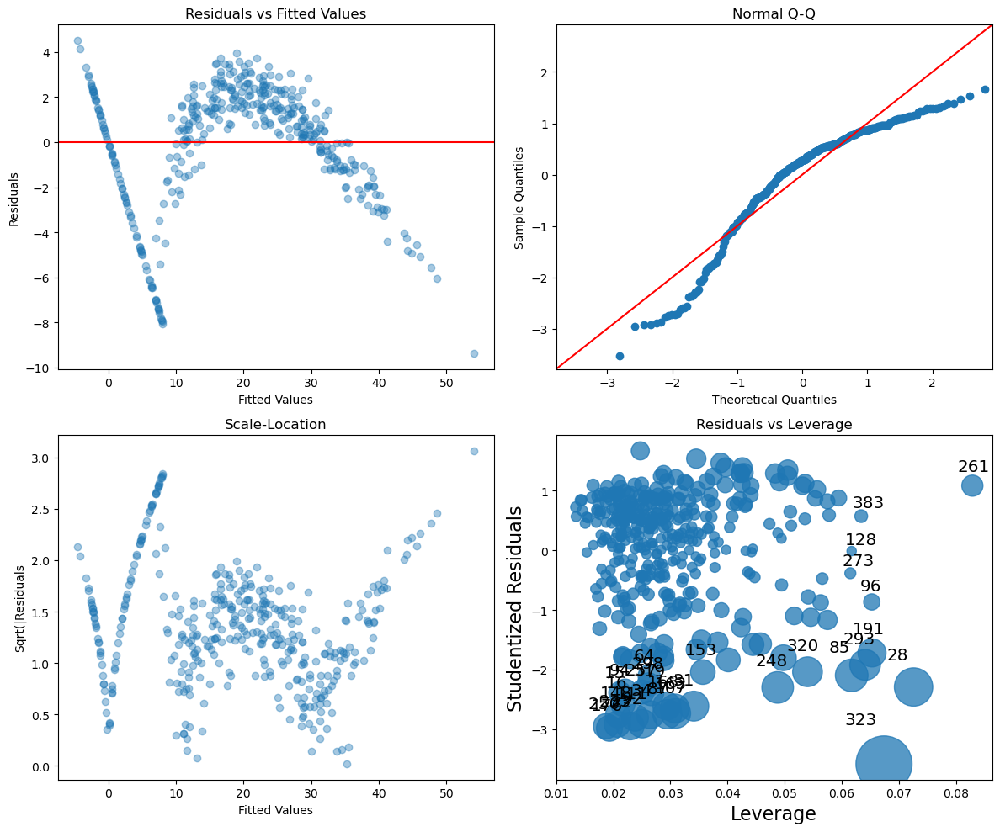

In [14]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(creditm2.fittedvalues, creditm2.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted Values")
sm.qqplot(creditm2.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(creditm2.fittedvalues, np.sqrt(np.abs(creditm2.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(creditm2, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

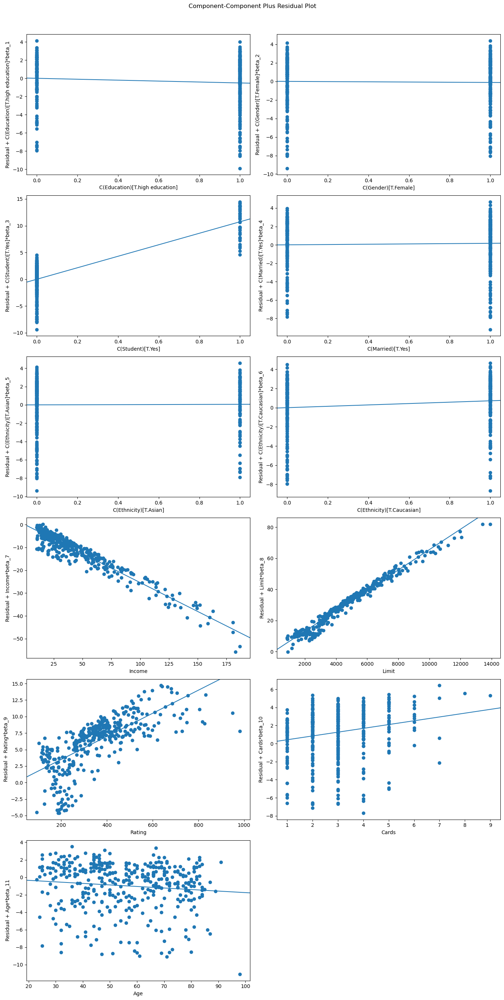

<F test: F=np.float64(5.372064069686962), p=6.249477551185148e-07, df_denom=378, df_num=9>
<F test: F=129.64423483871096, p=8.488796795283635e-44, df_denom=386, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  warnings.warn('covariance of constraints does not have full '


In [15]:
fig = sm.graphics.plot_ccpr_grid(creditm2, fig = plt.figure(figsize = (14,28)))
plt.show()

print(linear_reset(creditm2, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(creditm2, power = [2,3], test_type = "fitted", use_f = True))

In [16]:
credit2bp = bptest(creditm2.resid, creditm2.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, credit2bp):
    print(f"{stat}:{score}")

BP statistics:24.01818816798813
BP p-value:0.012656740482785858
f-value:2.253265913865567
f p-value:0.011515003374163453


In [17]:
X = creditm2.model.exog
vif = pd.DataFrame({"Variable": creditm2.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})

print(vif[vif["VIF"] >= 10])

    Variable         VIF
0  Intercept   34.387115
8      Limit  233.286723
9     Rating  235.219326


In [18]:
rstudent = OLSInfluence(creditm2).resid_studentized_external 
df = creditm2.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
323,-3.581821,0.000385,0.15383
0,0.221439,0.824867,1.00000
272,1.120268,0.263292,1.00000
271,0.781337,0.435081,1.00000
270,0.008128,0.993519,1.00000
269,0.451143,0.652138,1.00000
268,0.963566,0.335864,1.00000
267,0.123305,0.901930,1.00000
266,-1.662937,0.097133,1.00000
265,0.957247,0.339038,1.00000


In [19]:
print(creditm2.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
323  0.067407  0.074989       -3.528436
28   0.072579  0.033878       -2.279213
85   0.061749  0.023883       -2.086807
248  0.048792  0.022344       -2.286331
293  0.064099  0.020917       -1.914386
31   0.034107  0.019788       -2.593168
320  0.054016  0.019566       -2.027813
107  0.030943  0.019557       -2.711057
87   0.029475  0.018785       -2.724433
163  0.030798  0.018340       -2.631690


In [20]:
print(anova_lm(creditm2, type = 2))

                 df        sum_sq       mean_sq            F         PR(>F)
C(Education)    1.0    221.269691    221.269691    29.230953   1.124918e-07
C(Gender)       1.0     53.621036     53.621036     7.083636   8.102292e-03
C(Student)      1.0   3459.471805   3459.471805   457.015404   1.450068e-67
C(Married)      1.0     46.421115     46.421115     6.132487   1.369762e-02
C(Ethnicity)    2.0    143.351009     71.675505     9.468732   9.660201e-05
Income          1.0  10385.839382  10385.839382  1372.026960  1.834911e-129
Limit           1.0  47360.108237  47360.108237  6256.532857  1.974656e-241
Rating          1.0    106.998981    106.998981    14.135159   1.963242e-04
Cards           1.0     87.587300     87.587300    11.570768   7.396201e-04
Age             1.0     34.878093     34.878093     4.607589   3.245021e-02
Residual      388.0   2937.045552      7.569705          NaN            NaN


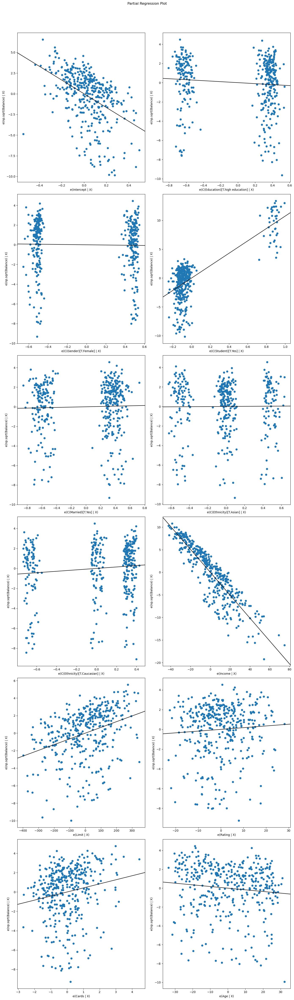

In [21]:
fig = sm.graphics.plot_partregress_grid(creditm2, fig = plt.figure(figsize = (14,48)))
plt.show()

Once again we see a similar story, everything was violated. The next one we will try is a quadratic transformation.

In [22]:
creditm3 = smf.ols("I(Balance**2)~Income+Limit+Rating+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = Credit).fit()
print(creditm3.summary())

                            OLS Regression Results                            
Dep. Variable:        I(Balance ** 2)   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     141.5
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          2.46e-128
Time:                        20:18:35   Log-Likelihood:                -5593.4
No. Observations:                 400   AIC:                         1.121e+04
Df Residuals:                     388   BIC:                         1.126e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

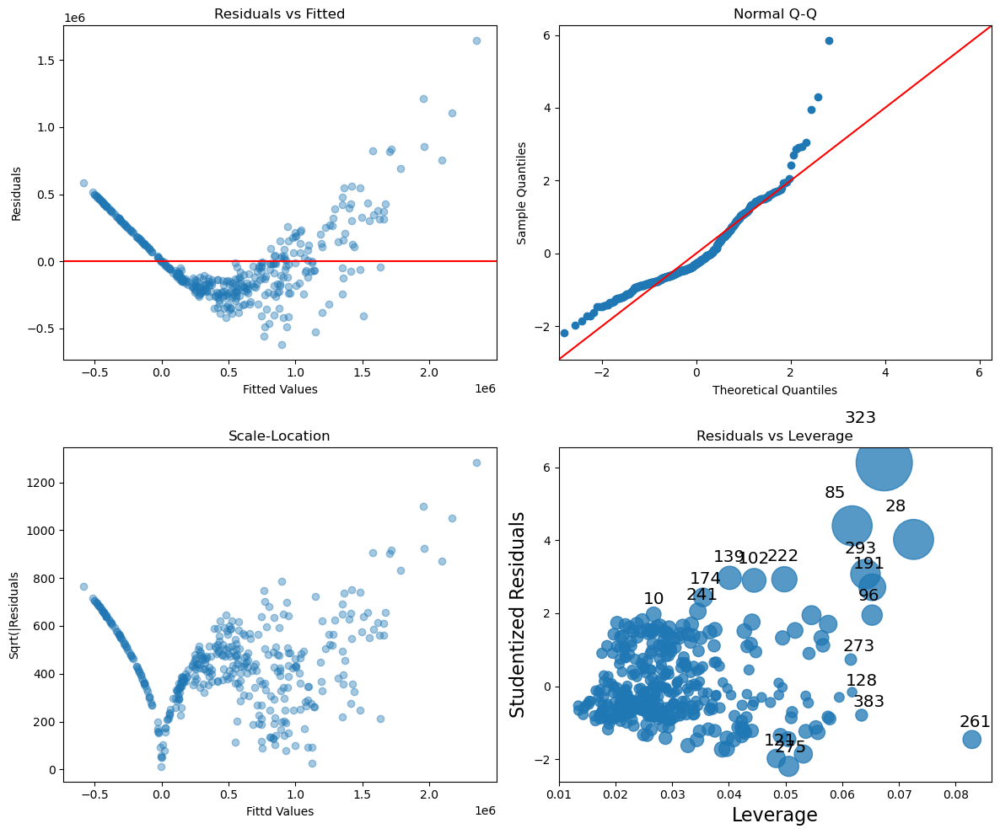

In [23]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(creditm3.fittedvalues, creditm3.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(creditm3.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(creditm3.fittedvalues, np.sqrt(np.abs(creditm3.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fittd Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(creditm3, ax = axes [1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

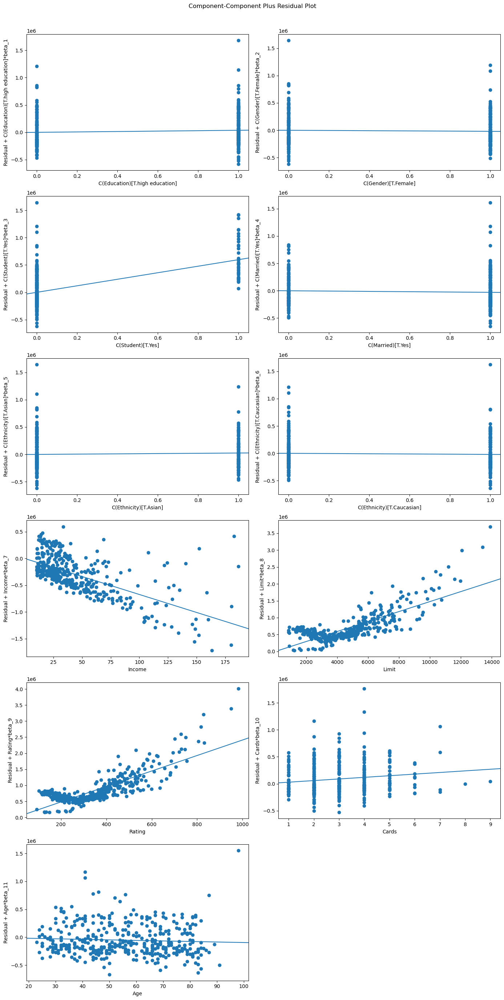

<F test: F=np.float64(25.468564809616836), p=3.518162940963546e-34, df_denom=378, df_num=9>
<F test: F=1627.9554066757157, p=2.442872246215564e-192, df_denom=398, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  warnings.warn('covariance of constraints does not have full '


In [24]:
fig = sm.graphics.plot_ccpr_grid(creditm3, fig = plt.figure(figsize = (14, 28)))
plt.show()

print(linear_reset(creditm3, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(creditm3, power = [2,3], test_type = "fitted", use_f = True))

In [25]:
credit3bp = bptest(creditm3.resid, creditm3.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, credit3bp):
    print(f"{stat}:{score}")

BP statistics:76.59611563269108
BP p-value:6.690897942420469e-12
f-value:8.354117026602108
f p-value:3.2192319235484214e-13


In [26]:
X = creditm3.model.exog
vif = pd.DataFrame({"Variable": creditm3.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

    Variable         VIF
0  Intercept   34.387115
8      Limit  233.286723
9     Rating  235.219326


In [27]:
rstudent = OLSInfluence(creditm3).resid_studentized_external
df = creditm3.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
323,6.127140,2.198756e-09,8.795023e-07
85,4.399231,1.405378e-05,5.621513e-03
28,4.024698,6.860882e-05,2.744353e-02
293,3.073178,2.267504e-03,9.070017e-01
0,-0.433725,6.647295e-01,1.000000e+00
272,-1.239291,2.159869e-01,1.000000e+00
271,-0.584703,5.590875e-01,1.000000e+00
270,-0.022035,9.824313e-01,1.000000e+00
269,-0.478261,6.327336e-01,1.000000e+00
268,1.644310,1.009221e-01,1.000000e+00


In [28]:
print(creditm3.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
323  0.067407  0.206661        5.857515
28   0.072579  0.101656        3.948116
85   0.061749  0.101347        4.298736
293  0.064099  0.052755        3.040272
191  0.065306  0.042178        2.691470
222  0.049795  0.036837        2.904362
102  0.044459  0.032049        2.875025
139  0.040157  0.030170        2.941716
96   0.065267  0.021954        1.942445
275  0.050561  0.021222       -2.186794


In [29]:
print(anova_lm(creditm3, type = 2))

                 df        sum_sq       mean_sq           F         PR(>F)
C(Education)    1.0  6.237509e+09  6.237509e+09    0.073865   7.859348e-01
C(Gender)       1.0  2.968192e+10  2.968192e+10    0.351495   5.536132e-01
C(Student)      1.0  1.215014e+13  1.215014e+13  143.882816   2.057091e-28
C(Married)      1.0  4.667071e+09  4.667071e+09    0.055268   8.142621e-01
C(Ethnicity)    2.0  1.593156e+11  7.965780e+10    0.943314   3.902267e-01
Income          1.0  4.173716e+13  4.173716e+13  494.254544   3.313855e-71
Limit           1.0  7.572517e+13  7.572517e+13  896.742990  6.424494e-103
Rating          1.0  1.043545e+12  1.043545e+12   12.357735   4.910380e-04
Cards           1.0  4.495289e+11  4.495289e+11    5.323354   2.156722e-02
Age             1.0  1.029632e+11  1.029632e+11    1.219298   2.701828e-01
Residual      388.0  3.276453e+13  8.444468e+10         NaN            NaN


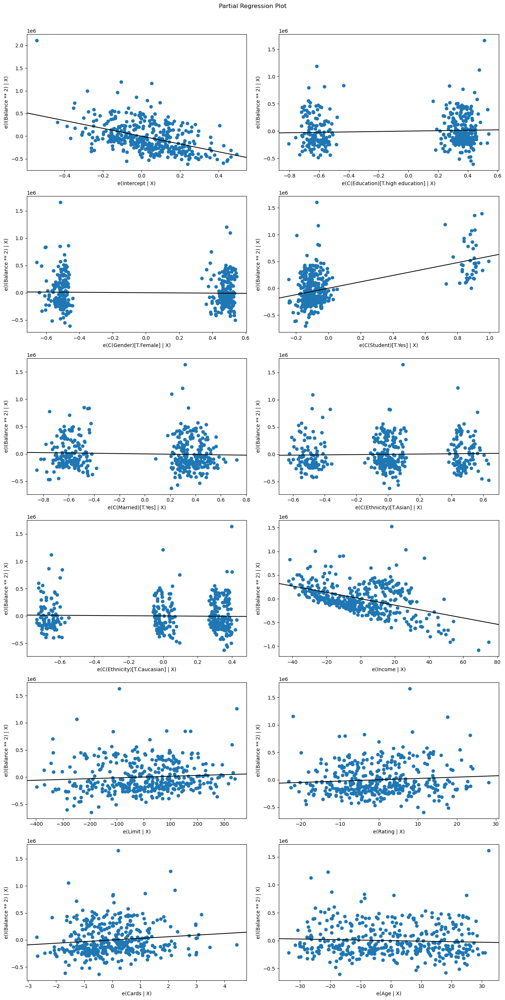

In [30]:
fig = sm.graphics.plot_partregress_grid(creditm3, fig = plt.figure(figsize = (14, 28)))
plt.show()

Same story, lastly we will try the log transformation.

In [31]:
creditm4 = smf.ols("Balance_log~Income+Limit+Rating+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)" , data = Credit).fit()
print(creditm4.summary())

                            OLS Regression Results                            
Dep. Variable:            Balance_log   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     185.2
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          7.09e-147
Time:                        20:18:42   Log-Likelihood:                -439.28
No. Observations:                 400   AIC:                             902.6
Df Residuals:                     388   BIC:                             950.5
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

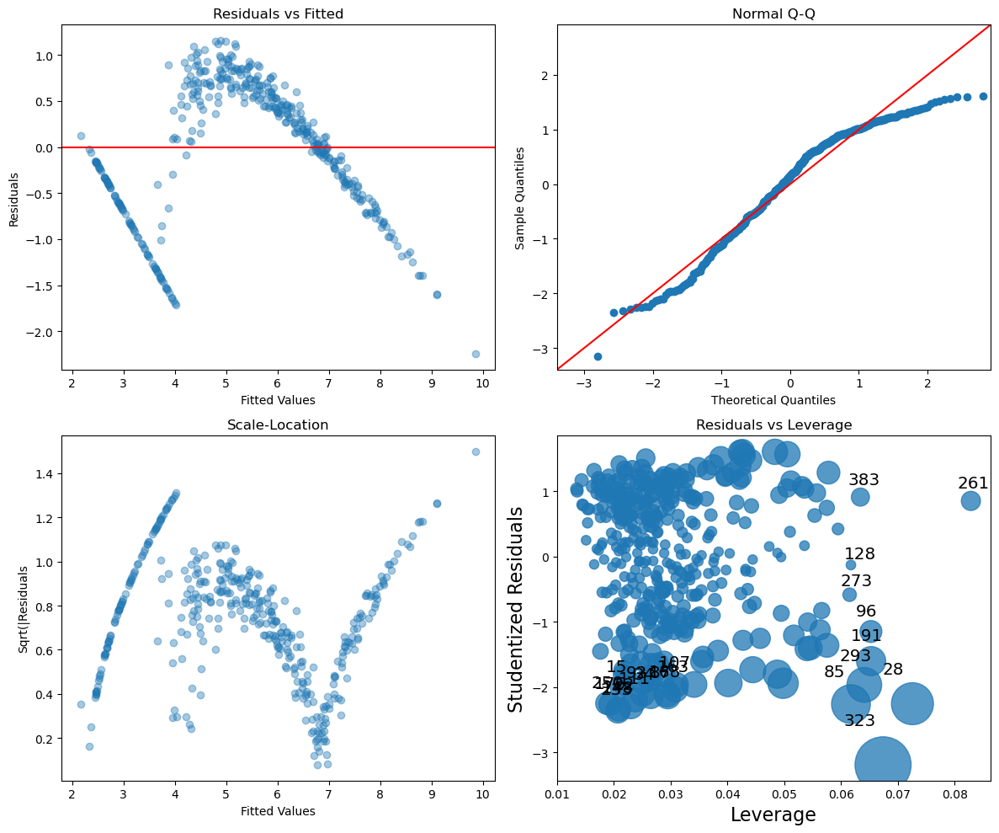

In [32]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(creditm4.fittedvalues, creditm4.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(creditm4.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(creditm4.fittedvalues, np.sqrt(np.abs(creditm4.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(creditm4, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

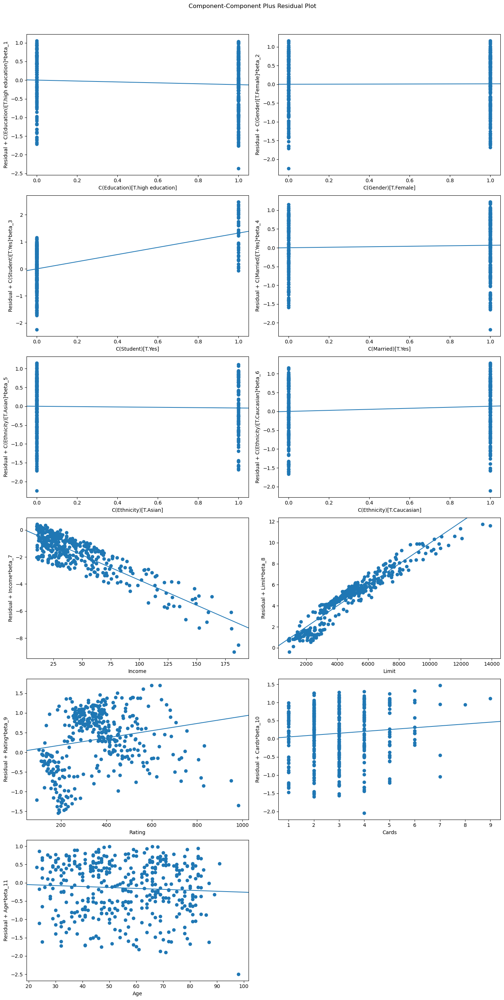

<F test: F=np.float64(10.565715528375144), p=1.243755568938886e-14, df_denom=378, df_num=9>
<F test: F=236.15860296545503, p=1.0406886665028087e-67, df_denom=386, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  warnings.warn('covariance of constraints does not have full '


In [33]:
fig = sm.graphics.plot_ccpr_grid(creditm4, fig = plt.figure(figsize = (14,28)))
plt.show()

print(linear_reset(creditm4, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(creditm4, power = [2,3], test_type = "fitted", use_f = True))

In [34]:
credit4bp = bptest(creditm4.resid, creditm4.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, credit4bp):
    print(f"{stat}:{score}")

BP statistic:29.29125029139028
BP p-value:0.0020452580233302525
f-value:2.7870458515411904
f p-value:0.0016754514192755708


In [35]:
X = creditm4.model.exog
vif = pd.DataFrame({"Variables": creditm4.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

   Variables         VIF
0  Intercept   34.387115
8      Limit  233.286723
9     Rating  235.219326


In [36]:
rstudent = OLSInfluence(creditm4).resid_studentized_external 
df = creditm4.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjustable p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjustable p-value,Bonferri p-value
323,-3.195193,0.001512,0.604678
0,0.665294,0.506258,1.000000
272,1.037283,0.300250,1.000000
271,0.887227,0.375507,1.000000
270,0.685982,0.493134,1.000000
269,0.249265,0.803287,1.000000
268,-0.237952,0.812044,1.000000
267,-0.099728,0.920612,1.000000
266,-0.911727,0.362479,1.000000
265,0.926381,0.354824,1.000000


In [37]:
print(creditm4.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
323  0.067407  0.060067       -3.157936
28   0.072579  0.032879       -2.245345
85   0.061749  0.027810       -2.251830
293  0.064099  0.021957       -1.961381
222  0.049795  0.016372       -1.936238
191  0.065306  0.014926       -1.601116
248  0.048792  0.013841       -1.799425
139  0.040157  0.013021       -1.932596
102  0.044459  0.011620       -1.731129
87   0.029475  0.011445       -2.126551


In [38]:
print(anova_lm(creditm4, type = 2))

                 df      sum_sq     mean_sq            F         PR(>F)
C(Education)    1.0    6.417821    6.417821    11.823392   6.483157e-04
C(Gender)       1.0    1.536416    1.536416     2.830501   9.329403e-02
C(Student)      1.0   49.581261   49.581261    91.342324   1.414805e-19
C(Married)      1.0    1.499678    1.499678     2.762820   9.728568e-02
C(Ethnicity)    2.0    5.570028    2.785014     5.130762   6.319670e-03
Income          1.0  150.810502  150.810502   277.834438   1.976034e-47
Limit           1.0  887.567342  887.567342  1635.143248  3.291575e-141
Rating          1.0    0.913001    0.913001     1.682000   1.954297e-01
Cards           1.0    1.265074    1.265074     2.330614   1.276666e-01
Age             1.0    0.749546    0.749546     1.380871   2.406735e-01
Residual      388.0  210.609150    0.542807          NaN            NaN


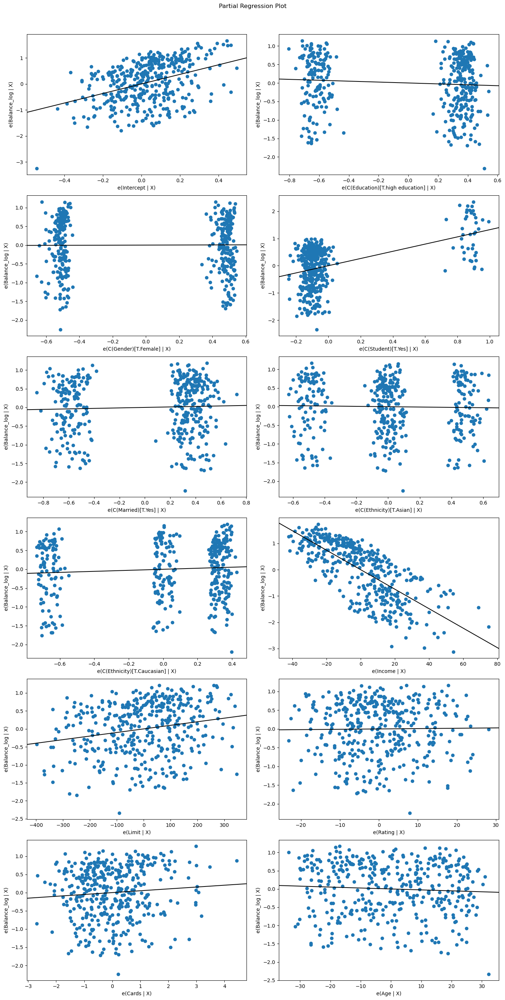

In [39]:
fig = sm.graphics.plot_partregress_grid(creditm4, fig = plt.figure(figsize = (14, 28)))
plt.show()

Based off of all of these, square root model actually performed the best with the constant variance being fixed, however there were still other violations that prevents us from choosing that model for any valid inferences. We can try a power-transformations to see what they suggest for us. 

In [40]:
mpt = MultivariatePowerTransform(family = "box-cox")
Z = mpt.fit_transform(Y = Credit[["Balance_plus","Income","Limit","Rating","Age", "Cards"]], X = None)
labels = ["Balance","Income","Limit","Rating","Age", "Cards"]
for label, lam in zip(labels, mpt.lambdas_):
    print(f"{label}:{lam}")

Balance:0.48320595892673823
Income:0.39478193639179443
Limit:0.7833950371834701
Rating:0.7217456823454117
Age:0.7958207895152644
Cards:0.3674041247773485


We see from our multivariate transformation, that we would need to transform our numerical variables to something that would be hard for us to explain without a visual effects plot. We will go ahead and fit the model with the recommendations and check to see if our assumptions have been met.

In [41]:
creditpre = smf.ols("I(Balance_plus**0.48)~I(Income**0.38)+I(Limit**0.77)+I(Rating**0.69)+I(Cards**0.37)+I(Age**0.81)+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = Credit).fit()
print(creditpre.summary())

                               OLS Regression Results                              
Dep. Variable:     I(Balance_plus ** 0.48)   R-squared:                       0.950
Model:                                 OLS   Adj. R-squared:                  0.948
Method:                      Least Squares   F-statistic:                     666.5
Date:                     Sun, 21 Dec 2025   Prob (F-statistic):          3.46e-244
Time:                             20:18:49   Log-Likelihood:                -892.54
No. Observations:                      400   AIC:                             1809.
Df Residuals:                          388   BIC:                             1857.
Df Model:                               11                                         
Covariance Type:                 nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

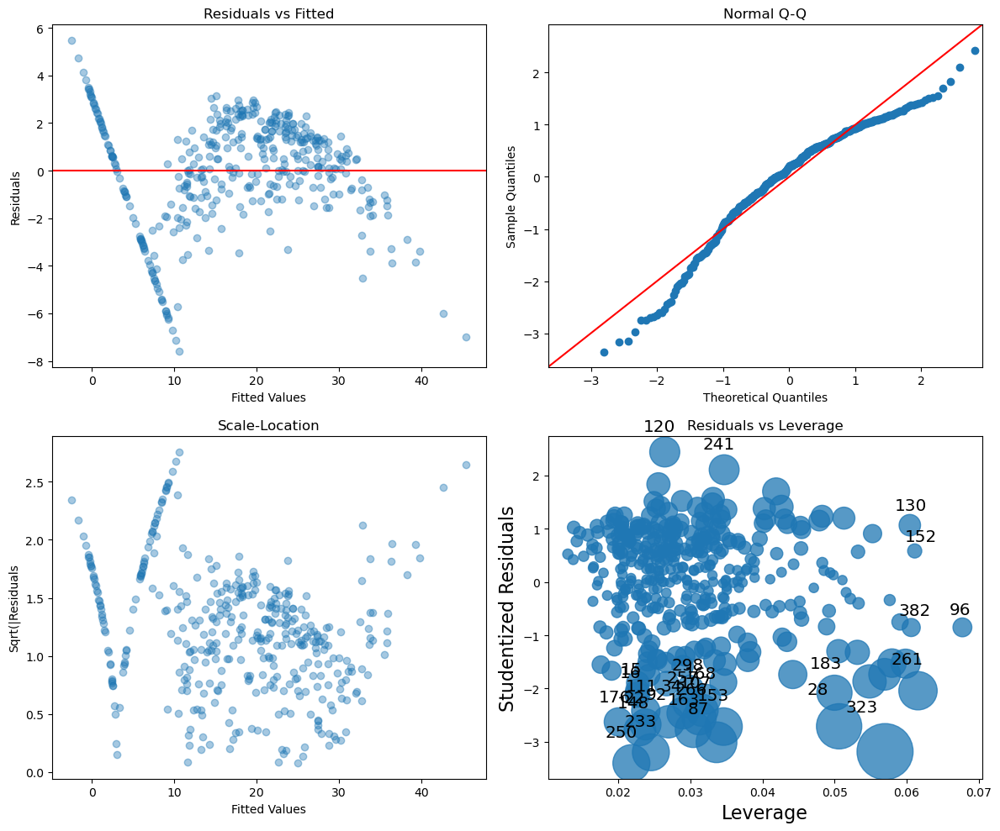

In [42]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(creditpre.fittedvalues, creditpre.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(creditpre.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(creditpre.fittedvalues, np.sqrt(np.abs(creditpre.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(creditpre, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

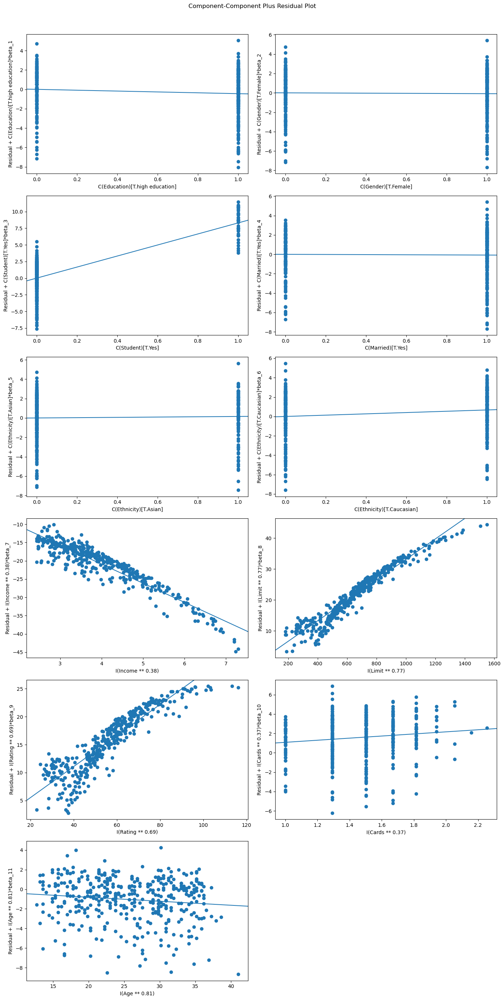

<F test: F=np.float64(22.011575919988516), p=5.295996844458057e-30, df_denom=378, df_num=9>
<F test: F=118.66127706512496, p=6.788461810635288e-41, df_denom=386, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  warnings.warn('covariance of constraints does not have full '


In [43]:
fig = sm.graphics.plot_ccpr_grid(creditpre, fig = plt.figure(figsize = (14,28)))
plt.show()

print(linear_reset(creditpre, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(creditpre, power = [2,3], test_type = "fitted", use_f = True))

In [44]:
precreditbptest = bptest(creditpre.resid, creditpre.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "p f-value"]

for stat, score in zip(labels, precreditbptest):
    print(f"{stat}:{score}")

BP statistics:31.241880965724
BP p-value:0.0010081916244159396
f-value:2.9883717534869034
p f-value:0.0007867519942536197


In [45]:
X = creditpre.model.exog
vif = pd.DataFrame({"Variable": creditpre.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

            Variable         VIF
0          Intercept  107.927276
8   I(Limit ** 0.77)  213.114575
9  I(Rating ** 0.69)  211.290801


In [46]:
rstudent = OLSInfluence(creditpre).resid_studentized_external
df = creditpre.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent),df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
250,-3.402754,0.000737,0.294620
233,-3.199211,0.001491,0.596530
323,-3.186259,0.001558,0.623168
272,0.909188,0.363815,1.000000
271,0.796302,0.426343,1.000000
270,-0.709009,0.478745,1.000000
269,0.928129,0.353918,1.000000
268,1.565551,0.118269,1.000000
267,0.534881,0.593039,1.000000
266,-2.554495,0.011015,1.000000


In [47]:
print(creditpre.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = True).head(10))

     hat_diag       cooks_d  standard_resid
146  0.020363  1.241761e-08       -0.002677
231  0.026334  2.267983e-08       -0.003172
228  0.033168  2.733489e-08        0.003092
381  0.026119  1.563231e-07        0.008363
294  0.027175  2.574345e-07       -0.010516
232  0.037248  3.888509e-07       -0.010982
276  0.017241  4.033781e-07        0.016611
143  0.035972  7.647589e-07       -0.015682
308  0.036541  8.528870e-07        0.016427
288  0.023815  9.093366e-07       -0.021149


In [48]:
print(anova_lm(creditpre, type = 2))

                      df        sum_sq       mean_sq            F  \
C(Education)         1.0    135.408262    135.408262    25.868178   
C(Gender)            1.0     28.069385     28.069385     5.362330   
C(Student)           1.0   2193.579716   2193.579716   419.057966   
C(Married)           1.0     26.512110     26.512110     5.064831   
C(Ethnicity)         2.0     77.890775     38.945387     7.440065   
I(Income ** 0.38)    1.0   6173.472027   6173.472027  1179.370236   
I(Limit ** 0.77)     1.0  29584.504194  29584.504194  5651.776430   
I(Rating ** 0.69)    1.0    113.950994    113.950994    21.769016   
I(Cards ** 0.37)     1.0     18.882120     18.882120     3.607210   
I(Age ** 0.81)       1.0     27.236199     27.236199     5.203160   
Residual           388.0   2031.005254      5.234550          NaN   

                          PR(>F)  
C(Education)        5.702527e-07  
C(Gender)           2.109698e-02  
C(Student)          1.102484e-63  
C(Married)          2.497548e-0

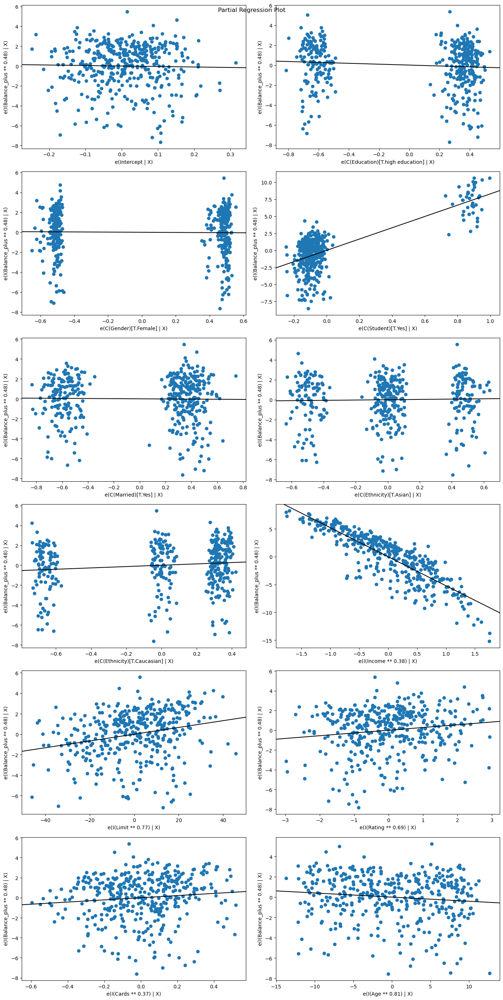

In [49]:
fig = sm.graphics.plot_partregress_grid(creditpre, fig = plt.figure(figsize = (14,28)))
plt.tight_layout()
plt.show()

The multivariate transformation was supposed to fix our assumption of normality, however we do see some of the tails that are a bit off, possibly due to outliers. Our assumption of homoscedasticity was fixed. We still see a violation of linearity as well as correlated variables in Rating and Limit. We can present this as is, or we can try to fit other higher ordered terms to see if we get an even better inference.

In [50]:
poly = PolynomialFeatures(degree = 2, include_bias = False)
X_poly_raw = poly.fit_transform(Credit[["Rating"]])

Q, R = np.linalg.qr(X_poly_raw)

#Credit["Rating_1"] = Q[:, 0]
#Credit["Rating_2"] = Q[:, 1]

credittrue = smf.ols("Balance_log~bs(np.log(Income), df = 8)+bs(np.log(Limit), df = 8)+bs(Rating, df = 4)+bs(np.log(Income), df = 8)*C(Student)+bs(np.log(Limit), df = 8)*C(Student)+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = Credit).fit()
print(credittrue.summary())

#"Balance_log~bs(np.log(Income), df = 4)+bs(np.log(Limit), df = 4)+Rating+C(Cards)+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)"

                            OLS Regression Results                            
Dep. Variable:            Balance_log   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     145.1
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          4.76e-200
Time:                        20:18:57   Log-Likelihood:                -217.15
No. Observations:                 400   AIC:                             524.3
Df Residuals:                     355   BIC:                             703.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

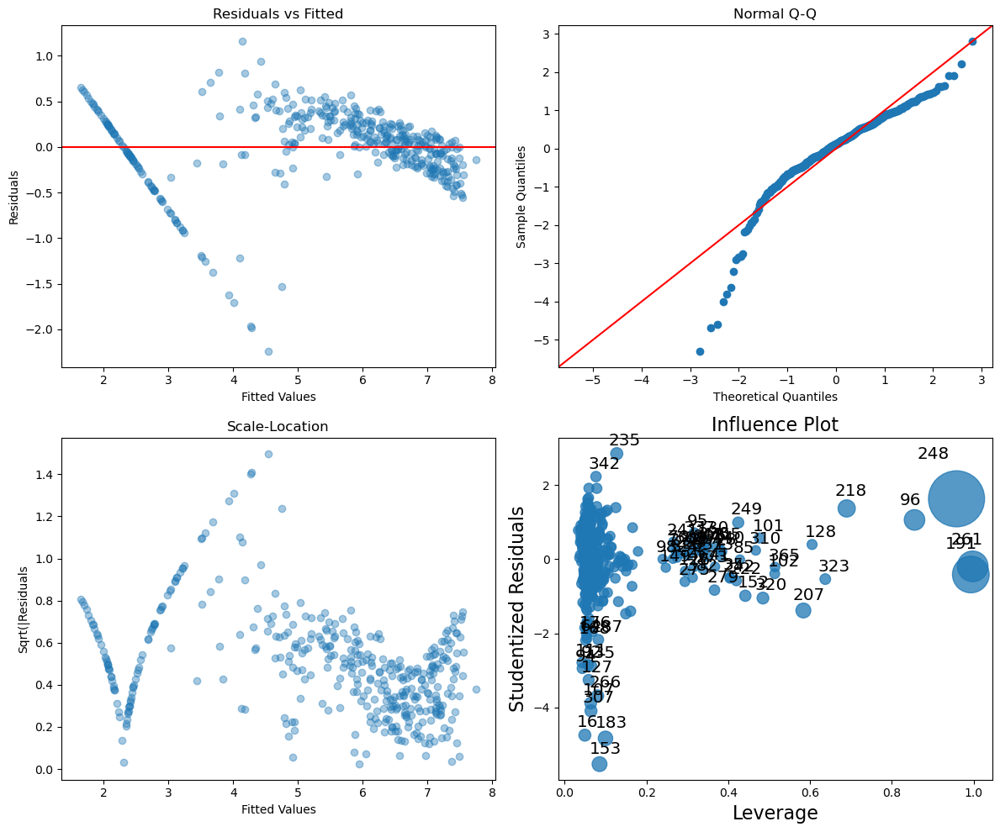

In [51]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(credittrue.fittedvalues, credittrue.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(credittrue.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(credittrue.fittedvalues, np.sqrt(np.abs(credittrue.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(credittrue, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_label("Residuals vs Leverage")
plt.tight_layout()
plt.show()

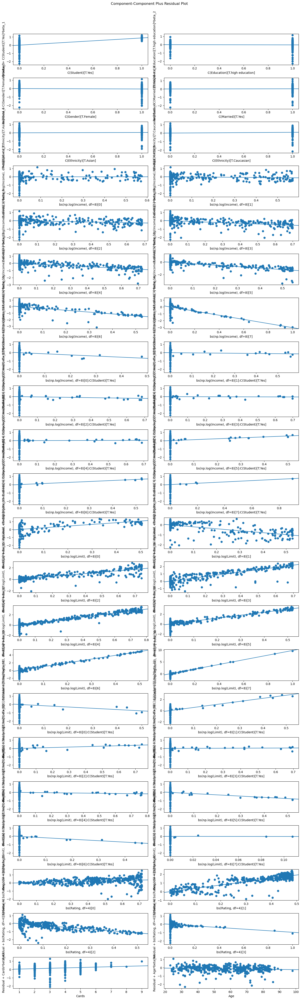

<F test: F=np.float64(1.4744012391313575), p=0.013281962923907379, df_denom=288, df_num=74>
<F test: F=252.796756517784, p=7.391346917034326e-69, df_denom=353, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 76, but rank is 74
  warnings.warn('covariance of constraints does not have full '


In [52]:
fig = sm.graphics.plot_ccpr_grid(credittrue, fig = plt.figure(figsize = (14,48)))
plt.show()

print(linear_reset(credittrue, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(credittrue, power = [2,3], test_type = "fitted", use_f = True))

In [53]:
credittruebp = bptest(credittrue.resid, credittrue.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, credittruebp):
    print(f"{stat}:{score}")

BP statistic:96.67508027733697
BP p-value:8.047202954511755e-06
f-value:2.571473935204673
f p-value:9.611870884539393e-07


In [54]:
X = credittrue.model.exog
vif = pd.DataFrame({"Variables": credittrue.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                        Variables         VIF
0                                       Intercept  316.100076
1                               C(Student)[T.Yes]  224.839822
17  bs(np.log(Income), df=8)[2]:C(Student)[T.Yes]   15.982254
18  bs(np.log(Income), df=8)[3]:C(Student)[T.Yes]   10.049219
19  bs(np.log(Income), df=8)[4]:C(Student)[T.Yes]   13.566628
20  bs(np.log(Income), df=8)[5]:C(Student)[T.Yes]   14.058238
24                     bs(np.log(Limit), df=8)[1]   17.275820
25                     bs(np.log(Limit), df=8)[2]   64.604180
26                     bs(np.log(Limit), df=8)[3]   63.604038
27                     bs(np.log(Limit), df=8)[4]  117.640240
28                     bs(np.log(Limit), df=8)[5]   82.551829
29                     bs(np.log(Limit), df=8)[6]   95.063742
30                     bs(np.log(Limit), df=8)[7]  154.081752
31   bs(np.log(Limit), df=8)[0]:C(Student)[T.Yes]   10.474832
33   bs(np.log(Limit), df=8)[2]:C(Student)[T.Yes]   18.443971
34   bs(

In [55]:
rstudent = OLSInfluence(credittrue).resid_studentized_external
df = credittrue.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
153,-5.523641,6.430388e-08,0.000026
183,-4.828200,2.051230e-06,0.000820
16,-4.742122,3.067841e-06,0.001227
307,-4.087351,5.399680e-05,0.021599
107,-3.878351,1.253127e-04,0.050125
266,-3.683783,2.656003e-04,0.106240
127,-3.252735,1.252637e-03,0.501055
272,0.214911,8.299599e-01,1.000000
271,0.657160,5.115036e-01,1.000000
270,1.908612,5.711839e-02,1.000000


In [56]:
print(credittrue.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
248  0.958237  1.343754        1.623406
191  0.993179  0.553198       -0.413495
261  0.997786  0.376005       -0.193782
96   0.855493  0.147220        1.057853
218  0.689547  0.092115        1.366116
207  0.583635  0.059402       -1.380939
153  0.085092  0.058220       -5.307445
183  0.099656  0.053949       -4.683272
235  0.127216  0.025687        2.816098
266  0.080486  0.025493       -3.620245


In [57]:
print(anova_lm(credittrue, type = 3))

                                        df      sum_sq     mean_sq  \
C(Student)                             1.0   47.920289   47.920289   
C(Education)                           1.0    8.893270    8.893270   
C(Gender)                              1.0    0.721939    0.721939   
C(Married)                             1.0    1.499678    1.499678   
C(Ethnicity)                           2.0    5.570028    2.785014   
bs(np.log(Income), df=8)               8.0  170.505381   21.313173   
bs(np.log(Income), df=8):C(Student)    8.0   11.270158    1.408770   
bs(np.log(Limit), df=8)                8.0  969.806370  121.225796   
bs(np.log(Limit), df=8):C(Student)     8.0   26.935600    3.366950   
bs(Rating, df=4)                       4.0    2.563683    0.640921   
Cards                                  1.0    0.949526    0.949526   
Age                                    1.0    0.522445    0.522445   
Residual                             355.0   69.361452    0.195384   

                   

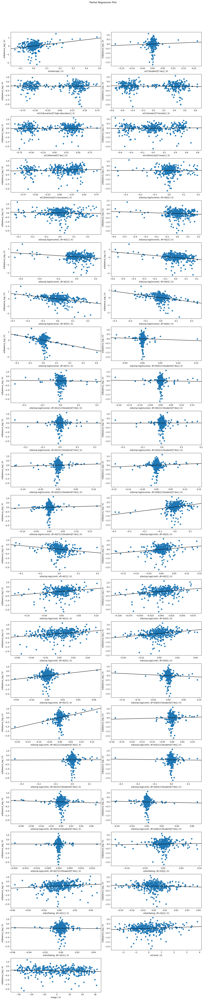

In [58]:
fig = sm.graphics.plot_partregress_grid(credittrue, fig = plt.figure(figsize = (14,70)))
plt.show()

Now this model is more of a generalized additive model that uses b-splines. This time we are using the log version of the model as we noted earlier, that covers several magnitudes when we look at its range. This model fixes the linearity assumption, however it does violate the assumption of homoscedasticity unlike the previous model. We have a lot of multicollinearity, but that is expected when dealing with basis splines and other GAMs, we do know that Rating and Limit have consistently been co-linear even from our previous simpler models. 

Looking at the ANOVA, almost every single variable looks to be significant, meaning we don't really have to remove anything, we can still try to fit a sub-model without several of them and then use our ANOVA to test whether they give us the same information.

In [59]:
credittrue2 = smf.ols("Balance_log~bs(np.log(Income), df = 8)+bs(np.log(Limit), df = 8)+bs(np.log(Income), df = 8)*C(Student)+bs(np.log(Limit), df = 8)*C(Student)+Cards+C(Education)+C(Gender)+C(Student)+C(Ethnicity)", data = Credit).fit(cov_type="HC3")
print(credittrue2.summary())
#"Balance_log~bs(np.log(Income), df = 8)+bs(np.log(Limit), df = 7)+bs(np.log(Income), df = 8)*C(Student)+bs(np.log(Limit), df = 7)*C(Student)+C(Cards)+C(Education)+C(Gender)+C(Student)+C(Ethnicity)"

                            OLS Regression Results                            
Dep. Variable:            Balance_log   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     319.1
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          1.55e-253
Time:                        20:19:17   Log-Likelihood:                -223.53
No. Observations:                 400   AIC:                             525.1
Df Residuals:                     361   BIC:                             680.7
Df Model:                          38                                         
Covariance Type:                  HC3                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

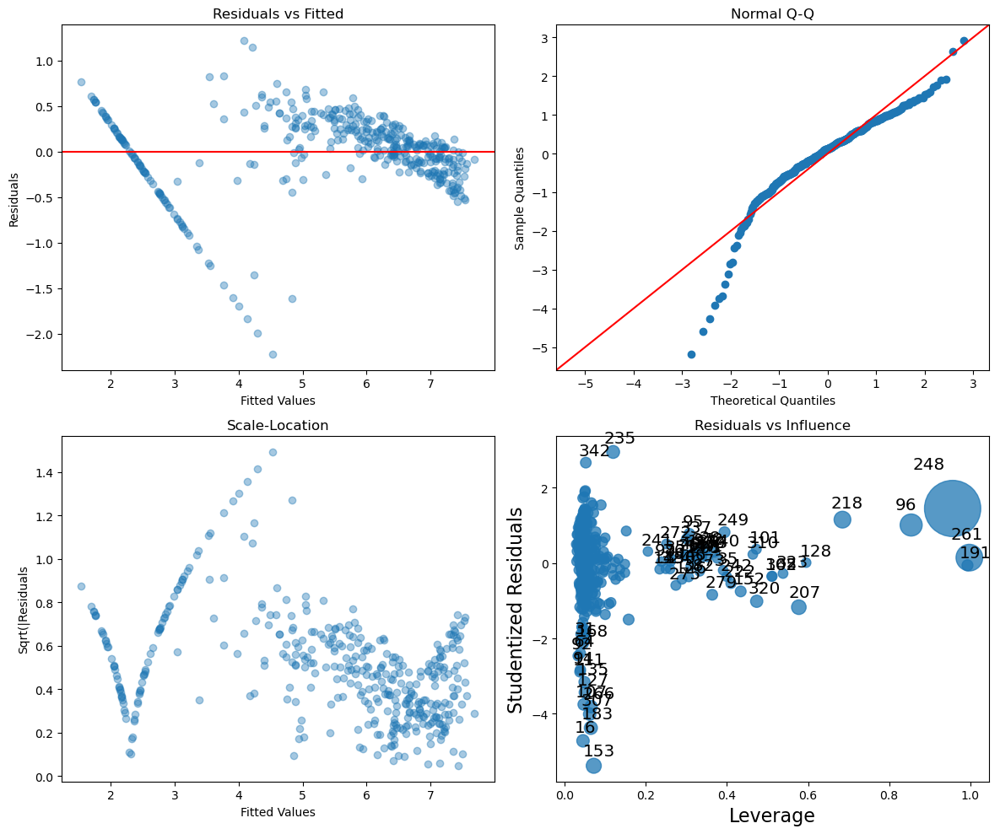

In [60]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(credittrue2.fittedvalues, credittrue2.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(credittrue2.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(credittrue2.fittedvalues, np.sqrt(np.abs(credittrue2.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(credittrue2, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Influence")
plt.tight_layout()
plt.show()

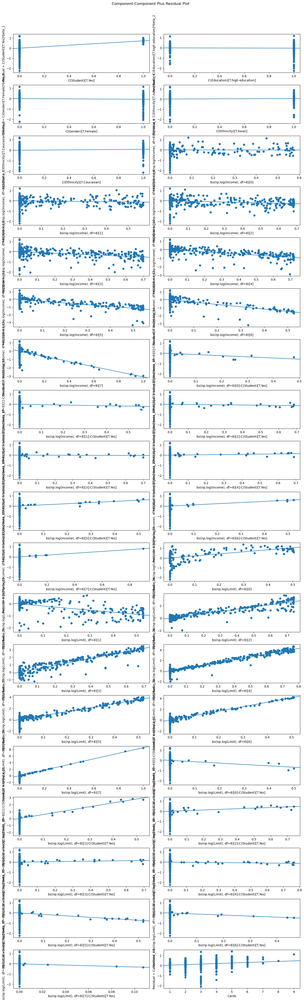

<F test: F=np.float64(1.6401564318781592), p=0.003144513271153903, df_denom=304, df_num=65>
<F test: F=261.63851675933853, p=8.004987070714857e-71, df_denom=359, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 66, but rank is 65
  warnings.warn('covariance of constraints does not have full '


In [61]:
fig = sm.graphics.plot_ccpr_grid(credittrue2, fig = plt.figure(figsize = (14,48)))
plt.show()

print(linear_reset(credittrue2, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(credittrue2, power = [2,3], test_type = "fitted", use_f = True))

In [62]:
credittrue2bp = bptest(credittrue2.resid, credittrue2.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, credittrue2bp):
    print(f"{stat}:{score}")

BP statistic:97.8994909490441
BP p-value:3.4855067756426005e-07
f-value:3.078595156749789
f p-value:2.263128327562671e-08


In [63]:
X = credittrue2.model.exog
vif = pd.DataFrame({"Variable": credittrue2.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                         Variable         VIF
0                                       Intercept  207.731778
1                               C(Student)[T.Yes]  201.564978
16  bs(np.log(Income), df=8)[2]:C(Student)[T.Yes]   15.708932
18  bs(np.log(Income), df=8)[4]:C(Student)[T.Yes]   13.248857
19  bs(np.log(Income), df=8)[5]:C(Student)[T.Yes]   13.936639
24                     bs(np.log(Limit), df=8)[2]   12.270721
26                     bs(np.log(Limit), df=8)[4]   12.942657
32   bs(np.log(Limit), df=8)[2]:C(Student)[T.Yes]   16.451474
33   bs(np.log(Limit), df=8)[3]:C(Student)[T.Yes]   11.215658
34   bs(np.log(Limit), df=8)[4]:C(Student)[T.Yes]   21.062017
35   bs(np.log(Limit), df=8)[5]:C(Student)[T.Yes]   28.392148
36   bs(np.log(Limit), df=8)[6]:C(Student)[T.Yes]   31.953341
37   bs(np.log(Limit), df=8)[7]:C(Student)[T.Yes]   14.163140


In [64]:
rstudent = OLSInfluence(credittrue2).resid_studentized_external
df = credittrue2.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
153,-5.380874,1.336277e-07,0.000053
16,-4.718210,3.407310e-06,0.001363
183,-4.374353,1.595904e-05,0.006384
307,-4.010252,7.373526e-05,0.029494
266,-3.811167,1.625682e-04,0.065027
107,-3.752337,2.040591e-04,0.081624
127,-3.431990,6.686306e-04,0.267452
135,-3.155235,1.738354e-03,0.695341
272,0.509494,6.107176e-01,1.000000
271,0.807301,4.200246e-01,1.000000


In [65]:
print(credittrue2.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
248  0.956453  1.181317        1.448312
261  0.997735  0.239641        0.145661
96   0.854206  0.153742        1.011621
218  0.684847  0.074184        1.153855
153  0.071636  0.053169       -5.183909
207  0.577249  0.047895       -1.169602
183  0.064473  0.032196       -4.268453
235  0.119440  0.029661        2.920319
307  0.061634  0.025999       -3.929017
16   0.045119  0.025471       -4.585119


In [66]:
print(anova_lm(credittrue2, type = 3))

                                        df      sum_sq     mean_sq  \
C(Student)                             1.0   47.920289   47.920289   
C(Education)                           1.0    8.893270    8.893270   
C(Gender)                              1.0    0.721939    0.721939   
C(Ethnicity)                           2.0    5.193394    2.596697   
bs(np.log(Income), df=8)               8.0  171.952978   21.494122   
bs(np.log(Income), df=8):C(Student)    8.0   10.996529    1.374566   
bs(np.log(Limit), df=8)                8.0  970.506016  121.313252   
bs(np.log(Limit), df=8):C(Student)     8.0   26.878021    3.359753   
Cards                                  1.0    1.846055    1.846055   
Residual                             361.0   71.611329    0.198369   

                                              F         PR(>F)  
C(Student)                           241.571056   4.551506e-42  
C(Education)                          44.831879   8.235322e-11  
C(Gender)                         

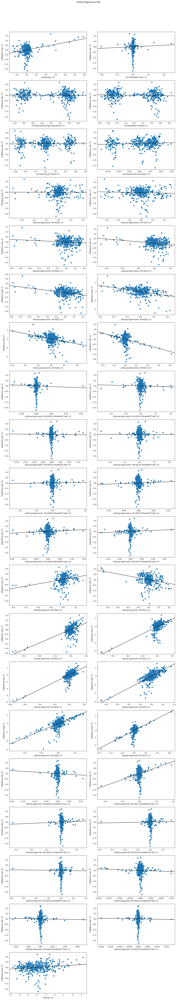

In [67]:
fig = sm.graphics.plot_partregress_grid(credittrue2, fig = plt.figure(figsize = (14, 80)))
plt.show()

In [68]:
print(anova_lm(credittrue2, credittrue))

   df_resid        ssr  df_diff   ss_diff         F    Pr(>F)
0     361.0  71.611329      0.0       NaN       NaN       NaN
1     355.0  69.361452      6.0  2.249878  1.919189  0.076885


The ANOVA tells us that both models are the not same, so we will go with the more complex, but let us do some more diagnostics with the simpler ones anyway.

There is one last thing we must do, I want to look at the importance of several categorical variable and whether we can get away with a simpler model. To do that, we will do an ANOVA to compare the model we just made now, with a simpler model only using the cubic basis-splines for Income, Limit, Student and a combination of those with Student. All other variables we currently have, will be dropped on the predictor side.

In [69]:
credittrue3 = smf.ols("Balance_log~bs(np.log(Income), df = 8)+bs(np.log(Limit), df = 8)+bs(np.log(Income), df = 8)*C(Student)+bs(np.log(Limit), df = 8)*C(Student)+C(Student)", data = Credit).fit(cov_type = "HC3")
print(anova_lm(credittrue3, credittrue2))

   df_resid        ssr  df_diff   ss_diff         F    Pr(>F)
0     366.0  74.538352      0.0       NaN       NaN       NaN
1     361.0  71.611329      5.0  2.927023  2.951084  0.012614


The ANOVA tells us that we can NOT get away with an even simpler model using just the three variables we discussed earlier, BUT let's run the diagnostics for this anyway!

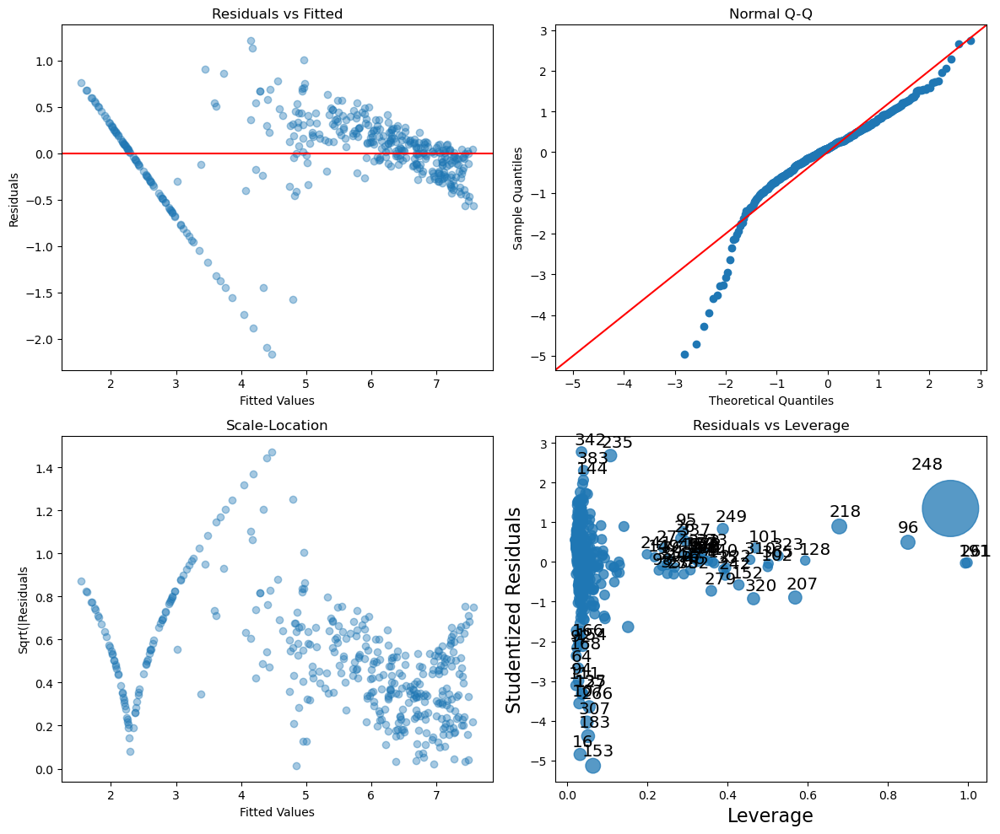

In [70]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(credittrue3.fittedvalues, credittrue3.resid, alpha = 0.4)
axes[0,0].axhline(0, color = "red")
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(credittrue3.get_influence().resid_studentized_internal, line = "45", ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(credittrue3.fittedvalues, np.sqrt(np.abs(credittrue3.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(credittrue3, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

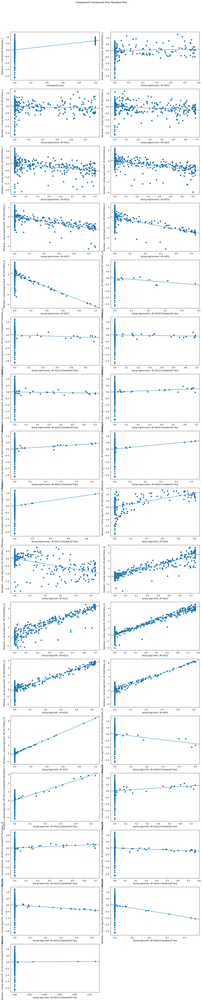

<F test: F=np.float64(1.585971475807171), p=0.0058887469081433715, df_denom=311, df_num=63>
<F test: F=224.28024960282147, p=3.3628948274800073e-64, df_denom=364, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 64, but rank is 63
  warnings.warn('covariance of constraints does not have full '


In [71]:
fig = sm.graphics.plot_ccpr_grid(credittrue3, fig = plt.figure(figsize = (14,70)))
plt.show()

print(linear_reset(credittrue3, power = [2,3], test_type = "exog", use_f = True))
print(linear_reset(credittrue3, power = [2,3], test_type = "fitted", use_f = True))

In [72]:
credittrue3bp = bptest(credittrue3.resid, credittrue3.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, credittrue3bp):
    print(f"{stat}:{score}")

BP statistics:97.50352349822697
BP p-value:2.7330741038833577e-08
f-value:3.574926649288807
f p-value:1.1710405021708585e-09


In [73]:
X = credittrue3.model.exog
vif = pd.DataFrame({"Variable": credittrue3.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                         Variable         VIF
0                                       Intercept  199.582412
1                               C(Student)[T.Yes]  198.924150
12  bs(np.log(Income), df=8)[2]:C(Student)[T.Yes]   15.667544
14  bs(np.log(Income), df=8)[4]:C(Student)[T.Yes]   13.168727
15  bs(np.log(Income), df=8)[5]:C(Student)[T.Yes]   13.498321
20                     bs(np.log(Limit), df=8)[2]   12.044367
22                     bs(np.log(Limit), df=8)[4]   12.639067
28   bs(np.log(Limit), df=8)[2]:C(Student)[T.Yes]   16.296851
29   bs(np.log(Limit), df=8)[3]:C(Student)[T.Yes]   10.959603
30   bs(np.log(Limit), df=8)[4]:C(Student)[T.Yes]   20.808325
31   bs(np.log(Limit), df=8)[5]:C(Student)[T.Yes]   27.350142
32   bs(np.log(Limit), df=8)[6]:C(Student)[T.Yes]   31.191087
33   bs(np.log(Limit), df=8)[7]:C(Student)[T.Yes]   13.754772


In [74]:
rstudent = OLSInfluence(credittrue3).resid_studentized_external
df = credittrue3.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
153,-5.131446,4.675815e-07,0.000187
16,-4.845810,1.865865e-06,0.000746
183,-4.385173,1.516946e-05,0.006068
307,-4.034956,6.651523e-05,0.026606
266,-3.644178,3.070283e-04,0.122811
107,-3.560355,4.192040e-04,0.167682
127,-3.321011,9.872079e-04,0.394883
135,-3.315949,1.004729e-03,0.401891
111,-3.110187,2.016302e-03,0.806521
272,0.354964,7.228211e-01,1.000000


In [75]:
print(credittrue3.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
248  0.956091  1.156481        1.343797
153  0.064332  0.049802       -4.962583
218  0.678653  0.049471        0.892441
96   0.849911  0.040862        0.495324
207  0.568707  0.031167       -0.896450
183  0.052072  0.029595       -4.279882
235  0.107855  0.025051        2.654311
307  0.049234  0.023803       -3.953273
266  0.054805  0.021912       -3.584540
320  0.464748  0.021903       -0.926119


It seems as if we are still reaching the threshold for linearity. Since we are using robust standard-errors we can ignore the violation for homoscedasticity. We have some co-linearity with the basis-splines which is expected and we do see some outliers. Now, our assumption for normality is extremely off, but since that is our weakest assumption, we will work with it for now. The most important thing right now is to see what our variables are telling us.

In [76]:
print(credittrue3.summary())

                            OLS Regression Results                            
Dep. Variable:            Balance_log   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     414.6
Date:                Sun, 21 Dec 2025   Prob (F-statistic):          3.73e-268
Time:                        20:19:45   Log-Likelihood:                -231.55
No. Observations:                 400   AIC:                             531.1
Df Residuals:                     366   BIC:                             666.8
Df Model:                          33                                         
Covariance Type:                  HC3                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [77]:
print(anova_lm(credittrue3, type = 3))

                                        df      sum_sq     mean_sq  \
C(Student)                             1.0   47.920289   47.920289   
bs(np.log(Income), df=8)               8.0  175.140260   21.892533   
bs(np.log(Income), df=8):C(Student)    8.0   11.417916    1.427240   
bs(np.log(Limit), df=8)                8.0  979.836354  122.479544   
bs(np.log(Limit), df=8):C(Student)     8.0   27.666649    3.458331   
Residual                             366.0   74.538352    0.203657   

                                              F         PR(>F)  
C(Student)                           235.299351   2.318756e-41  
bs(np.log(Income), df=8)             107.497237   3.083881e-91  
bs(np.log(Income), df=8):C(Student)    7.008066   1.297049e-08  
bs(np.log(Limit), df=8)              601.401990  2.321590e-205  
bs(np.log(Limit), df=8):C(Student)    16.981180   1.786950e-21  
Residual                                    NaN            NaN  


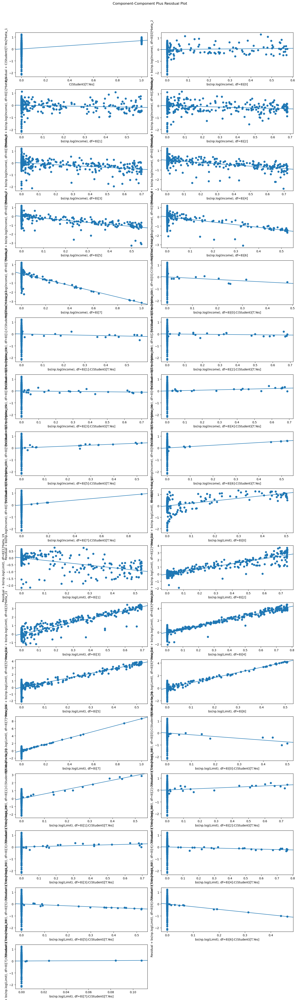

In [78]:
fig = sm.graphics.plot_ccpr_grid(credittrue3, fig = plt.figure(figsize = (14, 48)))
plt.show()

Due to the complexity of our GAMs and Cubic Basis-Splines, the best way to show the affects of this model is to utilize an effects plot for each of the complex spline variables, holding all other variables constant.

For the splines as discussed earlier, we will need to showcase an effects plot to show how the variables with splines behave with different inputs. The lone variable, Student, is more interpretable through our summary table, however, we can see that it has a p-value of .938. While the main effect of Student status is not significant, the ANOVA indicates that Student has a statistically significant impact on the response through its nonlinear interactions with Income and Limit. This means that Student status does not uniformly shift Balance levels, but it does alter the shape of the relationship between Income, Limit, and Balance.

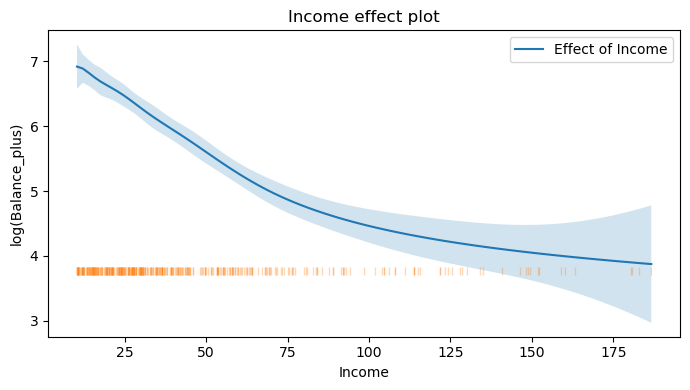

In [79]:
df = Credit.copy()
# 1. Create a grid of Income values
income_grid = np.linspace(df["Income"].min(), df["Income"].max(), 100)

#cards_mode = df["Cards"].astype("category").mode()[0]
# 2. Build a prediction DataFrame
pred_df = pd.DataFrame({
    "Income": income_grid,
    "Limit": df["Limit"].mean(),   # hold Limit at its mean
    "Student": df["Student"].astype("category").mode()[0],  # or "No", whichever you want to plot
    "Age": df["Age"].mean(),
    "Rating": df["Rating"].mean(),
    "Cards": df["Cards"].mean(),
    "Education": df["Education"].astype("category").mode()[0],
    "Gender": df["Gender"].astype("category").mode()[0],
    "Ethnicity": df["Ethnicity"].astype("category").mode()[0],
    "Married": df["Married"].astype("category").mode()[0]
})

# (Balance_plus_log is the response; we don't need to set it in pred_df)

# 3. Get predictions + 95% CI
pred_res = credittrue.get_prediction(pred_df)
pred_frame = pred_res.summary_frame(alpha=0.05)

# 4. Plot: x = Income, y = predicted log(Balance_plus),
#    with confidence band
plt.figure(figsize=(7,4))
plt.plot(income_grid, pred_frame["mean"], label="Effect of Income")
plt.fill_between(
    income_grid,
    pred_frame["mean_ci_lower"],
    pred_frame["mean_ci_upper"],
    alpha=0.2
)

# Add rug of actual Income values (like the little ticks in R)
y_rug = pred_frame["mean"].min() - 0.1
plt.plot(df["Income"], np.full_like(df["Income"], y_rug), "|", alpha=0.3)

plt.xlabel("Income")
plt.ylabel("log(Balance_plus)")
plt.title("Income effect plot")
plt.legend()
plt.tight_layout()
plt.show()


#Balance_log~bs(np.log(Income), df = 8)+bs(np.log(Limit), df = 7)+bs(Rating, df = 4)+bs(np.log(Income), df = 8)*C(Student)+bs(np.log(Limit), df = 7)*C(Student)+C(Cards)+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)

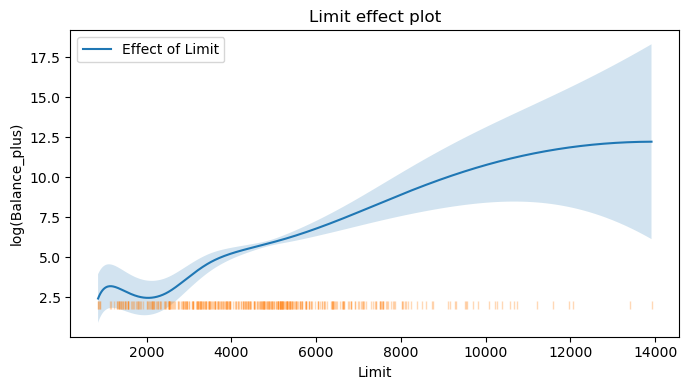

In [80]:
df = Credit.copy()
# 1. Create a grid of Income values
limit_grid = np.linspace(df["Limit"].min(), df["Limit"].max(), 1000)

#cards_mode = df["Cards"].astype("category").mode()[0]
# 2. Build a prediction DataFrame
pred_df = pd.DataFrame({
    "Income": df["Income"].mean(), # hold Income at its mean
    "Limit": limit_grid,   
    "Student": df["Student"].astype("category").mode()[0],                # or "No", whichever you want to plot
    "Age": df["Age"].mean(),
    "Rating": df["Rating"].mean(),
    "Cards": df["Cards"].mean(),
    "Education": df["Education"].astype("category").mode()[0],
    "Gender": df["Gender"].astype("category").mode()[0],
    "Ethnicity": df["Ethnicity"].astype("category").mode()[0],
    "Married": df["Married"].astype("category").mode()[0]
})

# (Balance_plus_log is the response; we don't need to set it in pred_df)

# 3. Get predictions + 95% CI
pred_res = credittrue.get_prediction(pred_df)
pred_frame = pred_res.summary_frame(alpha=0.05)

# 4. Plot: x = Income, y = predicted log(Balance_plus),
#    with confidence band
plt.figure(figsize=(7,4))
plt.plot(limit_grid, pred_frame["mean"], label="Effect of Limit")
plt.fill_between(
    limit_grid,
    pred_frame["mean_ci_lower"],
    pred_frame["mean_ci_upper"],
    alpha=0.2
)

# Add rug of actual Income values (like the little ticks in R)
y_rug = pred_frame["mean"].min() - 0.1
plt.plot(df["Limit"], np.full_like(df["Limit"], y_rug), "|", alpha=0.3)

plt.xlabel("Limit")
plt.ylabel("log(Balance_plus)")
plt.title("Limit effect plot")
plt.legend()
plt.tight_layout()
plt.show()


We see that with everything held constantly, as Income increases, the log of Balance seems to decrease which possibly tells us that the more money that one makes, the less need to utilize a lending product such as a credit card. This is, of course, being a non-student. We also see in the second effects plot that, while being a non-student, as the limit increases, the log of balance seems to increase. This can possibly tell us that, the more one has, the more they tend to spend without being too conscious of the fact that they have to pay back what they borrow. Of course, we can not come to that exact conclusion as to why the log of balance increase in this situation. 

This is the best we have within the linear regression setting, but going back to our histogram from the very beginning, we notated a heavy right skew with a heavy concentration of values at 0 for the Balance distribution. That indicated that a GAMMA or Tweetie model may have been the more appropriate method, so we will build that one out before looking at prediction capabilities of our models. The Tweetie model has more relaxed assumptions and is far more accurate for situations like this.

In [81]:
powers = np.arange(1.1, 1.9, 0.01)
aic_list = []
aic_list2 = []

for p in powers:
    result = smf.glm("Balance ~ Income*np.log(Limit)+bs(Rating, df = 4)+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = Credit, family = Tweedie(var_power = p, link = Log())).fit()
    aic_list.append((p, result.aic))
    aic_list2.append(result.llf)

best_p, best_aic = min(aic_list, key = lambda t: t[1])
print("best P:",best_p)
print("best_aic:",best_aic)

best_p = powers[np.argmax(aic_list2)]
print("also this:", best_p)


best P: 1.1
best_aic: 4086.2899608095036
also this: 1.1


The tweedie model serves as a hybrid between a Poisson model and a GAMMA regression that allows for 0's. With the Tweedie model, we are freely able to choose a value for "P", not to be confused with the p-value. If the P is within 1 and 2, then tweedie is appropriate to use. If p = 1, then we have a pure poison model, if p = 2, then it is a full gamma. If p = 0, then it is  a linear regression that is the best and finally if p = 3 then we are looking at an inverse linear regression. Here, we see that our power is at 1.1 meaning that the tweedie model is appropriate.  

In [82]:
credittweed = smf.glm("Balance~Income*np.log(Limit)+bs(Rating, df = 4)+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = Credit, family = Tweedie(var_power = best_p, link = Log())).fit()
print(credittweed.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Balance   No. Observations:                  400
Model:                            GLM   Df Residuals:                      384
Model Family:                 Tweedie   Df Model:                           15
Link Function:                    Log   Scale:                          25.763
Method:                          IRLS   Log-Likelihood:                -2027.1
Date:                Sun, 21 Dec 2025   Deviance:                       8218.5
Time:                        20:19:56   Pearson chi2:                 9.89e+03
No. Iterations:                    14   Pseudo R-squ. (CS):             0.9999
Covariance Type:            nonrobust                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [83]:
print(credittweed.wald_test_terms(scalar = True))

                            chi2        P>chi2  df constraint
Intercept              17.025379  3.688351e-05              1
C(Education)            0.177901  6.731836e-01              1
C(Gender)               0.000223  9.880725e-01              1
C(Student)            253.861503  3.737854e-57              1
C(Married)              0.017530  8.946672e-01              1
C(Ethnicity)            1.784026  4.098299e-01              2
Income                 73.804361  8.625582e-18              1
np.log(Limit)          16.533715  4.779267e-05              1
Income:np.log(Limit)   63.519679  1.587727e-15              1
bs(Rating, df=4)       73.822913  3.534505e-15              4
Cards                   7.689613  5.553954e-03              1
Age                     1.322648  2.501174e-01              1


We see our initial model and we also see that several of our variables are insignificant in this setting. We see an expected increase of about 7.2% in the balance when we go from 1 card to 2 cards, and an increase of about 7.7% when we go from 1 card to 3 cards. In fact we see an expected increase in balance when we go from one card to any amount of card. Keep in mind, these levels are only significant when we have 6 and 7 cards, but anything more or less than that reads as insignificant. We see several of our factors as insignificant like being married, ethnicity, education and gender. With income, each 1% increase in Income results in an expected decrease in balance of about 20%. Holding all things constant, with the log of limit we see an increase of 2.1% for every 1% increase in log of limit. The interaction between income and log of limit shows us that the effect of credit limit on balance depends on income and vice versa; as income increases, the percentage increase in expected balance associated with a 1% increase in credit limit becomes larger. In other words, the positive interaction between these two variables indicate that higher-income individuals exhibit a stronger increase in expected balance as credit limits rise, suggesting that additional credit availability is utilized more aggressively at higher income levels. As before, splines are not interpretable through here so we will show an effects plot at the end. Lastly, age indicates as age goes up 1%, we expect a .10% decrease in the expected balance. As always, we always want to diagnose all of our statistical models and this will be no different. 

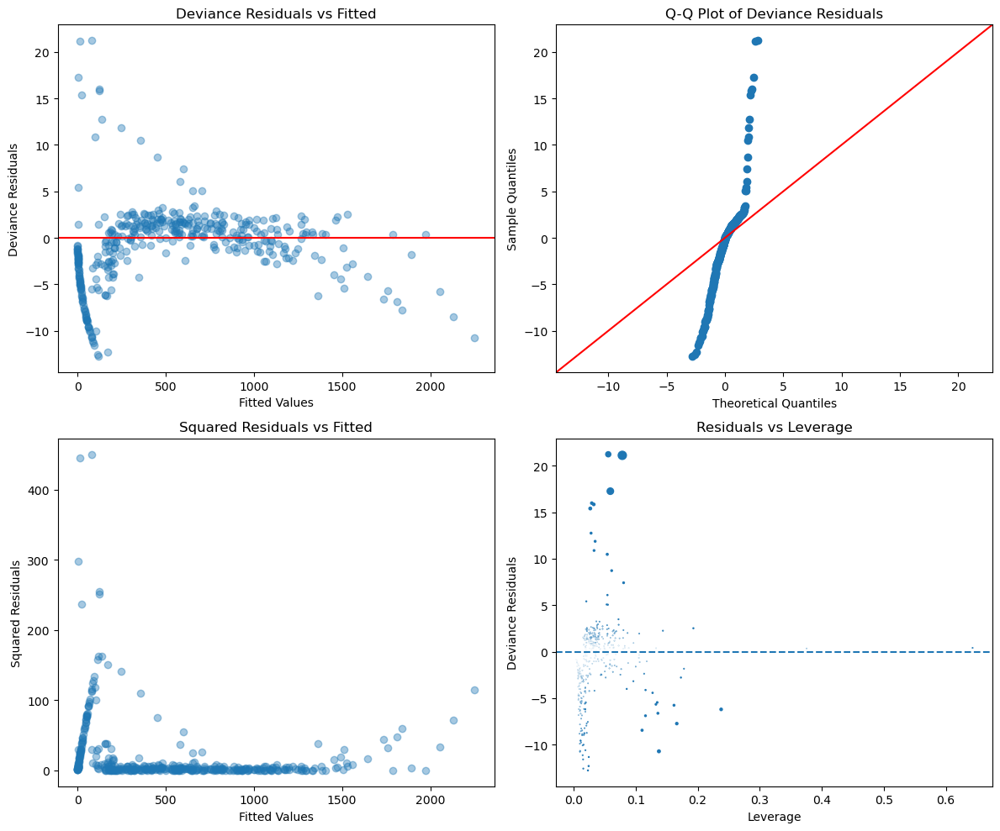

In [84]:
cooks = credittweed.get_influence().cooks_distance[0]
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(credittweed.fittedvalues, credittweed.resid_deviance, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Deviance Residuals")
axes[0,0].set_title("Deviance Residuals vs Fitted")
sm.qqplot(credittweed.resid_deviance, line = '45', ax = axes[0,1])
axes[0,1].set_title("Q-Q Plot of Deviance Residuals")
axes[1,0].scatter(credittweed.fittedvalues, credittweed.resid_deviance**2, alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Squared Residuals")
axes[1,0].set_title("Squared Residuals vs Fitted")
axes[1,1].scatter(credittweed.get_influence().hat_matrix_diag, credittweed.resid_deviance, s = 50 * cooks/cooks.max())
axes[1,1].axhline(0, linestyle="--")
axes[1,1].set_xlabel("Leverage")
axes[1,1].set_ylabel("Deviance Residuals")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

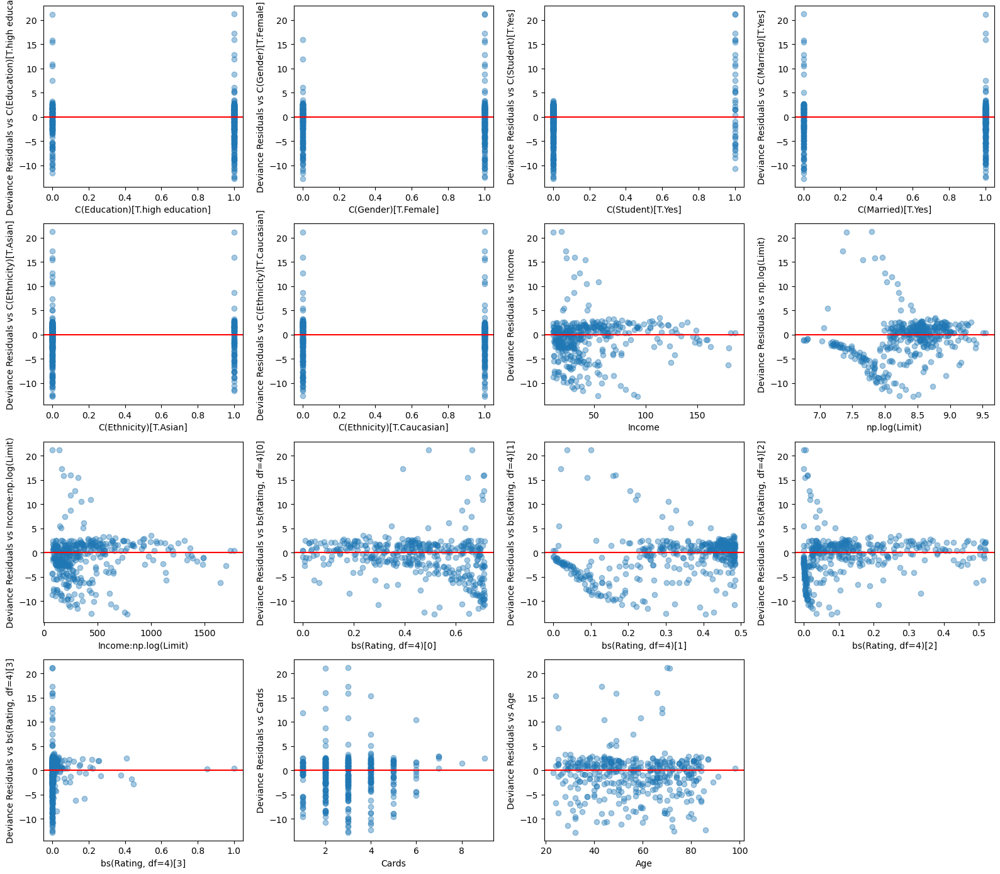

Deviance: 0.0


In [85]:
idsx = [(i, name) for i, name in enumerate(credittweed.model.exog_names) if name.lower() != 'intercept']
n_plots = len(idsx)
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idsx):
    ax.scatter(credittweed.model.exog[:, i], credittweed.resid_deviance, alpha = 0.4)
    ax.set_xlabel(name)
    ax.set_ylabel(f"Deviance Residuals vs {name}")
    ax.axhline(0, color = 'red')

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

print("Deviance:", scipy.stats.chi2.sf(credittweed.deviance, credittweed.df_resid))

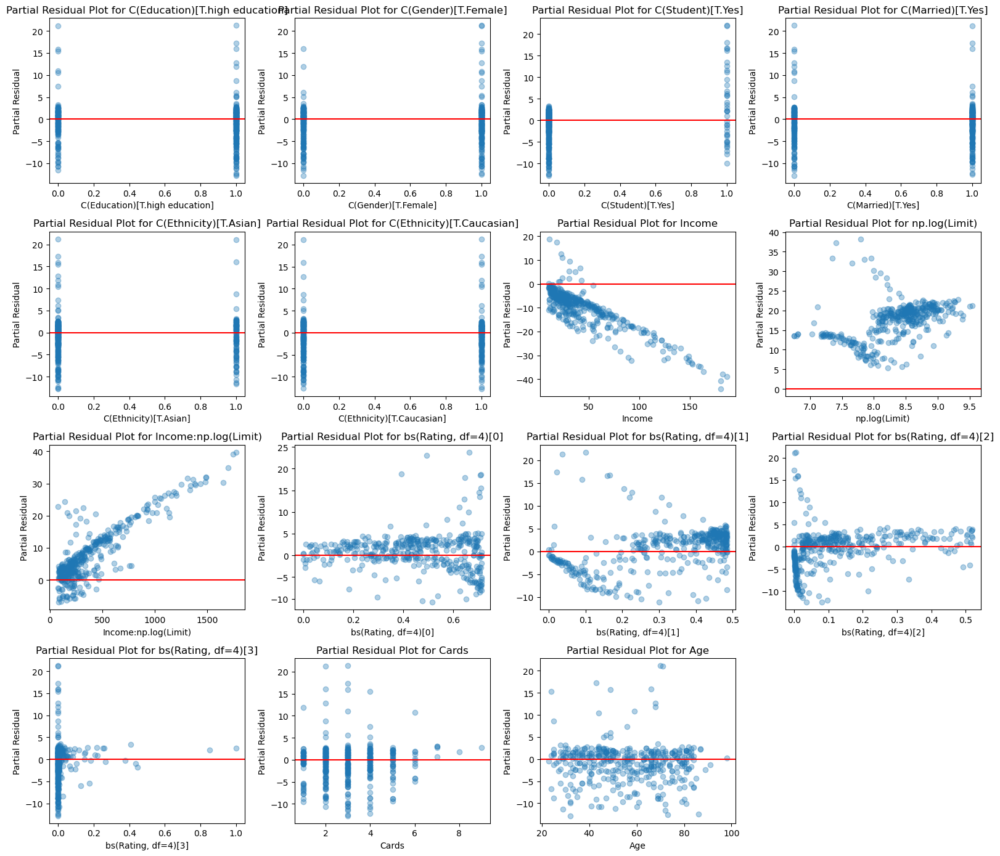

In [86]:
idxs = [(i, n) for i, n in enumerate(credittweed.model.exog_names) if n.lower() != "intercept"]
n_plots = len(idxs)
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize = (4*n_cols, 3.5 * n_rows))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idxs):
    #if var.lower() == "intercept":
       # continue
    partial = credittweed.model.exog[:, i] * credittweed.params.values[i] + credittweed.resid_deviance
    ax.scatter(credittweed.model.exog[:, i], partial, alpha = 0.35)
    ax.set_xlabel(name)
    ax.set_ylabel("Partial Residual")
    ax.set_title(f"Partial Residual Plot for {name}")
    ax.axhline(0, color = 'red')


for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

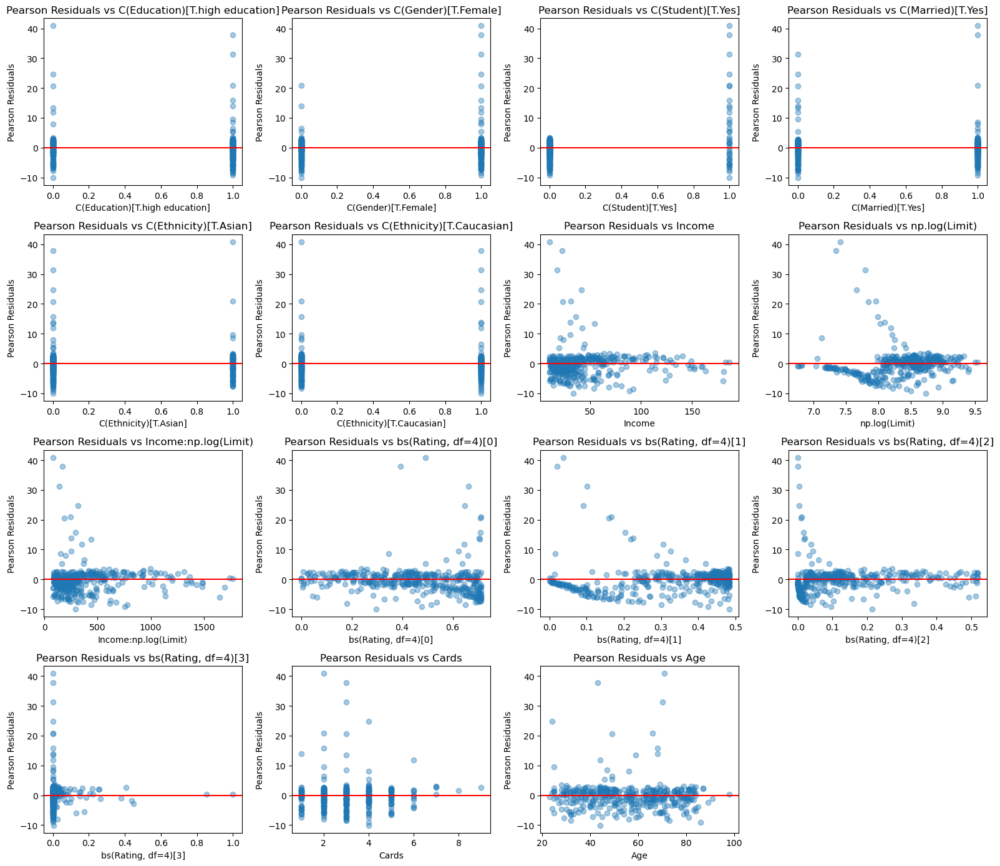

Dispersion Value: 25.763285582616618


In [87]:
idxs = [(i, n) for i, n in enumerate(credittweed.model.exog_names) if n.lower() != 'intercept']
n_plots = len(idxs)
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idxs):
    ax.scatter(credittweed.model.exog[:, i], credittweed.resid_pearson, alpha = 0.4)
    ax.set_xlabel(name)
    ax.set_ylabel("Pearson Residuals")
    ax.set_title(f"Pearson Residuals vs {name}")
    ax.axhline(0, color = 'red')

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

print("Dispersion Value:", np.sum(credittweed.resid_pearson**2)/credittweed.df_resid)

In [88]:
X = credittweed.model.exog
vif = pd.DataFrame({"Variable": credittweed.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                Variable           VIF
0              Intercept  16809.944101
7                 Income   1934.740692
8          np.log(Limit)    102.886527
9   Income:np.log(Limit)   2255.529893
10   bs(Rating, df=4)[0]     21.799919
11   bs(Rating, df=4)[1]     45.682747
12   bs(Rating, df=4)[2]     57.085563
13   bs(Rating, df=4)[3]     27.649163


In [89]:
print(credittweed.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
218  0.078362  0.373649        8.385331
249  0.059094  0.232220        7.691505
101  0.055746  0.148595        6.346014
222  0.137389  0.045203       -2.130952
152  0.026712  0.041848        4.939342
35   0.032323  0.035605        4.129763
261  0.237721  0.034862       -1.337393
324  0.029182  0.032785        4.177428
96   0.166208  0.031371       -1.586820
102  0.110242  0.021760       -1.676291


Our diagnostics check out several things; our deviance residuals vs fitted seems to show a claw despite most of the data being smooth. This claw around the lower fitted values can indicate structural zeros and if that is the case, we may have to move to a hurdle model which means we would need to create a logistic regression model to indicate whether an account will have a 0 or not and then use a gamma regression instead for our analysis since we will be utilizing a data set completely void of zeros. Other things to point is although our pearson residuals seem a bit flat, however our dispersion score is way above the acceptable value of 1 which could indicate some issues with our variance assumption as the variance must grow with the mean for gamma/tweedie. We also see some multi-collinearity between main affects of income, log of limit and their interaction value which is normal. We also see multi-collinearity with splines which is also normal. We also see we have several observations that are beyond the threshold for cook's distance. Lastly, our deviance score was 0. That indicates that the model likelihood matches that of the saturated model. This is expected in a tweedie models when strong predictors perfectly explain the zero mass and the positive mean structure. As a result, deviance-based goodness-of-fit statistics are not informative in this setting. 

We will move on to a hurdle model next.

Lastly, we can do an Elastic-Net regularization to see which terms are utilized the best for prediction. We will include every single term that we had in the credittrue model as our candidate model. Then we will utilize only the terms in the credittrue3 model to see if the simpler model predicts just as well as the more complex one. We will do an Elastic-Net pipeline that will allow us to select the best L1 ratio as well as the best alpha value for each model.

In [90]:
Credit = Credit.copy()
Credit["has_bal"] = (Credit["Balance"] > 0).astype(int)
creditbin = smf.glm("has_bal~Income+Limit+Cards+Age+C(Education)+C(Gender)+C(Married)+C(Ethnicity)", data = Credit, family = sm.families.Binomial()).fit()
print(creditbin.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                has_bal   No. Observations:                  400
Model:                            GLM   Df Residuals:                      390
Model Family:                Binomial   Df Model:                            9
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -51.991
Date:                Sun, 21 Dec 2025   Deviance:                       103.98
Time:                        20:20:07   Pearson chi2:                     658.
No. Iterations:                     9   Pseudo R-squ. (CS):             0.5535
Covariance Type:            nonrobust                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [91]:
print(creditbin.wald_test_terms(scalar = True))

                   chi2        P>chi2  df constraint
Intercept     24.291407  8.280767e-07              1
C(Education)   0.015305  9.015423e-01              1
C(Gender)      2.012820  1.559751e-01              1
C(Married)     0.013694  9.068447e-01              1
C(Ethnicity)   1.960628  3.751932e-01              2
Income        27.172036  1.861315e-07              1
Limit         52.794317  3.703713e-13              1
Cards          1.955423  1.620037e-01              1
Age            0.003992  9.496224e-01              1


Our predictors are far more simple than the regressional models, but we can see that several things jump out. The only variable that seem to matter whether you have a zero balance or not is Income and Income and that is it. Income states that with 1% increase in income, we expect our log odds of the account having a balance to go down by .12%. With each 1% increase in limit, the log odds of having a balance increase by .0013%. We left Rating and Student out because Rating is in fact highly correlated with Limit and Student was too much of a perfect predictor.

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:985: FutureWarning: linear keyword is deprecated, use which="linear"
  warnings.warn(msg, FutureWarning)
C:\Users\tariq\AppData\Local\Temp\ipykernel_33168\1121308280.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  g = df.groupby("bin").agg(predicted_mean = ("predicted", "mean"),


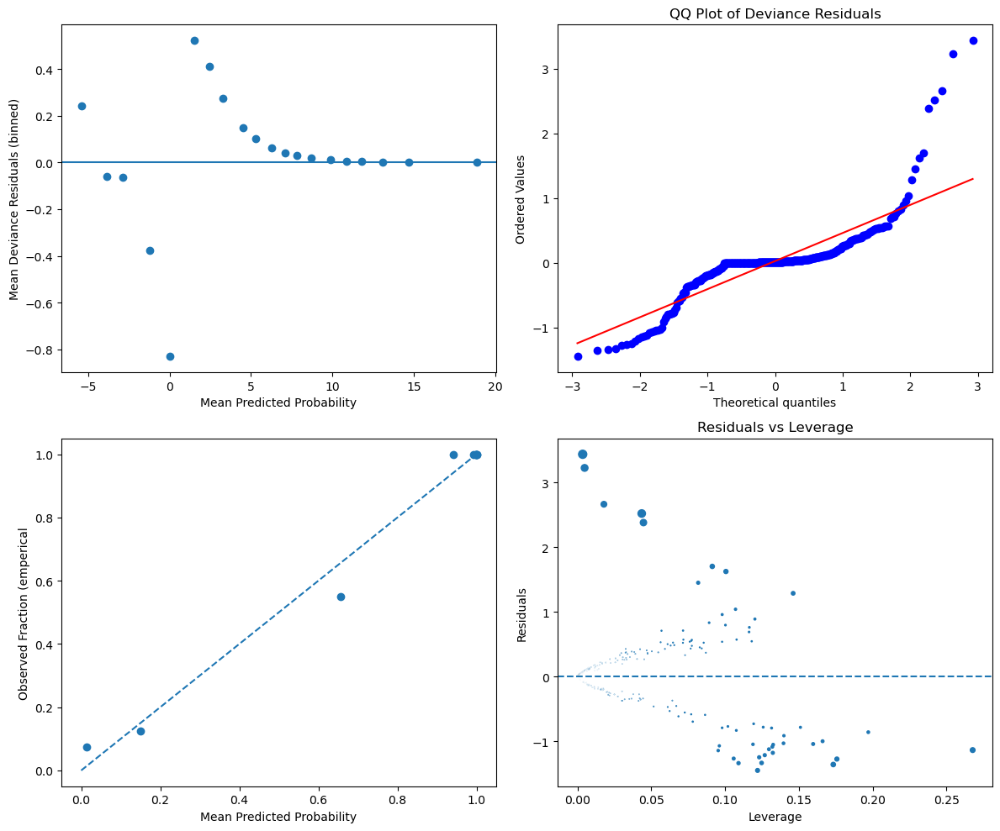

In [92]:
cooks = creditbin.get_influence().cooks_distance[0]
fig, axes = plt.subplots(2,2, figsize = (12,10))

df = pd.DataFrame({"resid": creditbin.resid_deviance,
                   "predicted": creditbin.predict(linear = True)})
df["bin"] = pd.qcut(df["predicted"], q = 20, duplicates = 'drop')

g = df.groupby("bin").agg(predicted_mean = ("predicted", "mean"),
                          resid_mean = ("resid", "mean"),
                          n = ("resid", "size"))

df2 = Credit.copy()
df2["p"] = creditbin.fittedvalues
df2["bin"] = pd.qcut(df2["p"], q = 10, duplicates = 'drop')

g2 = df2.groupby("bin", observed = True).agg(p_mean = ("p", "mean"),
                           y_mean = ("has_bal", "mean"),
                           n = ("has_bal", "size"))

axes[0,0].scatter(g["predicted_mean"], g["resid_mean"], marker = 'o')
axes[0,0].axhline(0)
axes[0,0].set_xlabel("Mean Predicted Probability")
axes[0,0].set_ylabel("Mean Deviance Residuals (binned)")
plt.sca(axes[0,1])
scipy.stats.probplot(creditbin.resid_deviance, dist = "norm", plot = plt)
axes[0,1].set_title("QQ Plot of Deviance Residuals")
axes[1,0].scatter(g2["p_mean"], g2["y_mean"], marker = 'o')
axes[1,0].plot([0,1],[0,1], linestyle = '--')
axes[1,0].set_xlabel("Mean Predicted Probability")
axes[1,0].set_ylabel("Observed Fraction (emperical")
axes[1,1].scatter(creditbin.get_influence().hat_matrix_diag, creditbin.resid_deviance, s = 50 * cooks/cooks.max())
axes[1,1].axhline(0, linestyle = '--')
axes[1,1].set_xlabel("Leverage")
axes[1,1].set_ylabel("Residuals")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

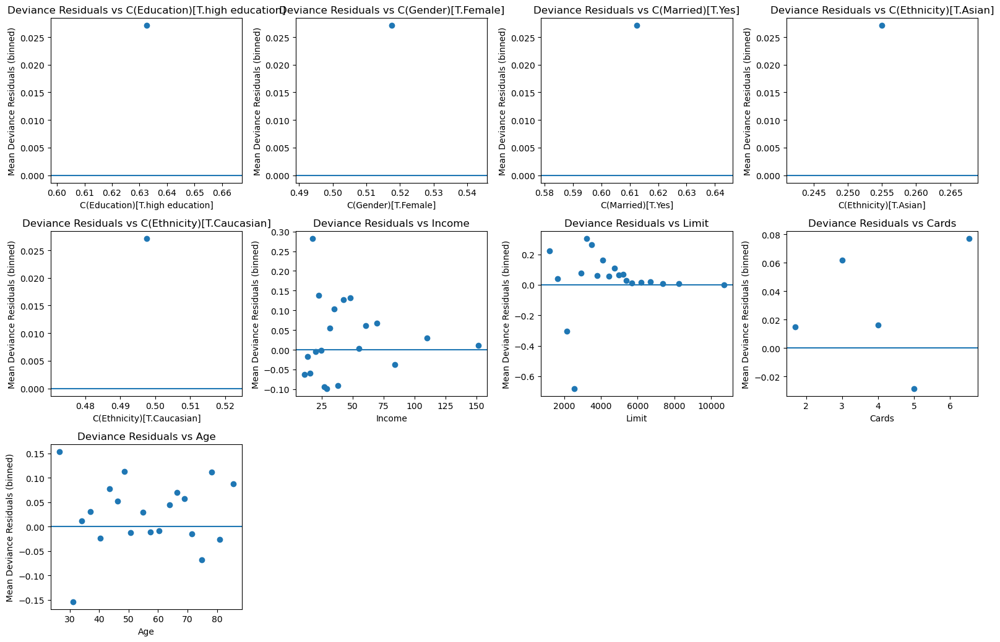

In [93]:
idsx = [(i, name) for i, name in enumerate(creditbin.model.exog_names) if name.lower() != "intercept"]
n_plots = len(idsx)
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idsx):
    df = pd.DataFrame({"predictor value": creditbin.model.exog[:, i],
                       "residuals": creditbin.resid_deviance})

    df["bin"] = pd.qcut(df["predictor value"], q = 20, duplicates = 'drop')

    g = df.groupby("bin", observed = True).agg(predictor_mean = ("predictor value", "mean"),
                              residual_mean = ("residuals", "mean"),
                              n = ("residuals", "size"))
    ax.scatter(g["predictor_mean"], g["residual_mean"], marker = 'o')
    ax.axhline(0)
    ax.set_xlabel(name)
    ax.set_ylabel("Mean Deviance Residuals (binned)")
    ax.set_title(f"Deviance Residuals vs {name}")

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()


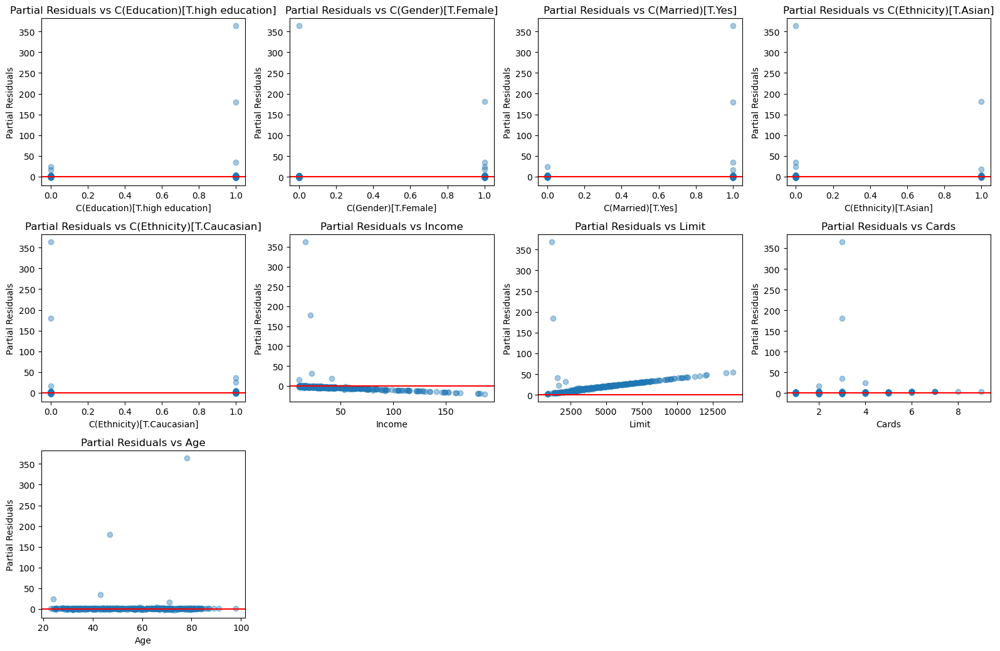

Calibration Intercept: -4.2417431604816283e-13
Calibration Slope: 0.9999999999999614


In [94]:
idsx = [(i, name) for i, name in enumerate(creditbin.model.exog_names) if name.lower() != 'intercept']
n_plots = len(idsx)
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idsx):
    partial = creditbin.model.exog[:,i] * creditbin.params.values[i] + creditbin.resid_working
    ax.scatter(creditbin.model.exog[:,i], partial, alpha = 0.4)
    ax.axhline(0, color = 'red')
    ax.set_xlabel(name)
    ax.set_ylabel("Partial Residuals")
    ax.set_title(f"Partial Residuals vs {name}")

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()


y = Credit["has_bal"]
p_te = creditbin.predict(Credit)
y = np.asarray(y).astype(float)
p_te = np.asarray(p_te).astype(float)
p_te = np.clip(p_te, 1e-12, 1 - 1e-12)
l_p = np.log(p_te/ (1 - p_te))

x = sm.add_constant(l_p)
fit = sm.GLM(y, x, family = sm.families.Binomial()).fit()

intercept = float(fit.params[0])
slope = float(fit.params[1])

print("Calibration Intercept:", intercept)
print("Calibration Slope:", slope)

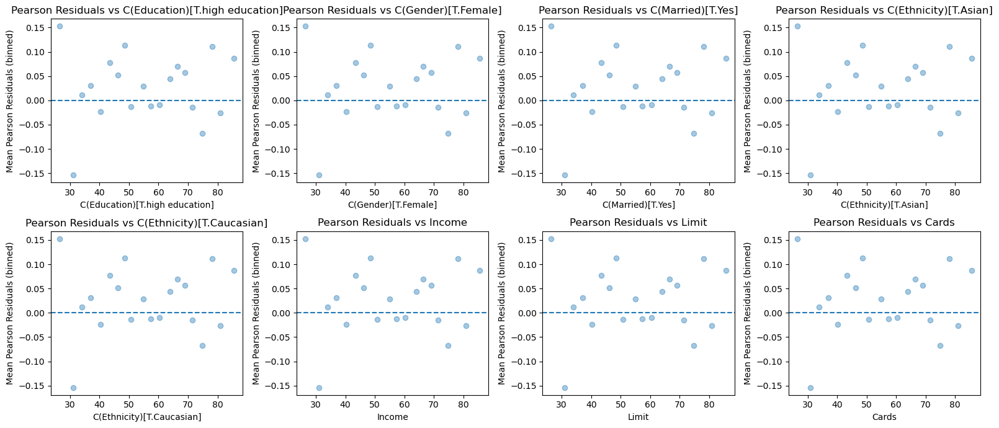

Dispersion Value: 1.6874161397827496


In [95]:
idsx = [(i, name) for i, name in enumerate(creditbin.model.exog_names) if name.lower() != 'intercept']
n_plots = len(idsx)
n_cols = 4
n_rows = int(n_plots/n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idsx):
    df = pd.DataFrame({"predictor value": creditbin.model.exog[:, i],
                      "residuals": creditbin.resid_pearson})

    df["bin"] = pd.qcut(df["predictor value"], q = 20, duplicates = 'drop')

    q = df.groupby("bin", observed = True).agg(predictor_mean = ("predictor value", "mean"),
                              residuals_mean = ("residuals", "mean"),
                              n = ("residuals", "size"))
    ax.scatter(g["predictor_mean"], g["residual_mean"], alpha = 0.4)
    ax.axhline(0, linestyle = '--')
    ax.set_xlabel(name)
    ax.set_ylabel("Mean Pearson Residuals (binned)")
    ax.set_title(f"Pearson Residuals vs {name}")

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()
print("Dispersion Value:", np.sum(creditbin.resid_pearson**2)/creditbin.df_resid)

In [96]:
X = creditbin.model.exog
vif = pd.DataFrame({"Variable": creditbin.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] > 10])

    Variable        VIF
0  Intercept  28.425786


In [97]:
creditbin.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10)

,hat_diag,cooks_d,standard_resid
320,0.003579,0.130656,19.072696
152,0.043583,0.109042,4.891743
242,0.004890,0.088548,13.423462
218,0.044751,0.078201,4.085692
249,0.017952,0.062560,5.850061
153,0.267787,0.045038,-1.109716
163,0.173346,0.038319,-1.351797
279,0.091377,0.036087,1.894307
324,0.100629,0.034059,1.744704
87,0.175797,0.032265,-1.229930


The diagnostic deviance plot shows that we have our fitted values centered around 0, however we do seem to be off in some areas, however we do not see a trend or any obvious curvature. Our QQ plot, although not as appropriate as in the OLS setting, shows that we have no outliers that may be 4 standard deviations away. Our calibration plot also seems to be well aligned. We also see very little outliers in general although there are two that has appeared in the tweedie model as well, observations 205 and 383. Our deviance vs covariate plots show exactly what was confirmed by the summary plot in regards to important variables as the binned deviance plot for the covariates show limit and income being strongly centered around 0, age looking more flat and less concentrated. We do not see an obvious curve or trend in any of the plots. Our pearson residual plots also show a flat cloud and combined with a dispersion parameter of about 1.4, there isn't too much to worry about. We also do not have any multi-collinearity. 

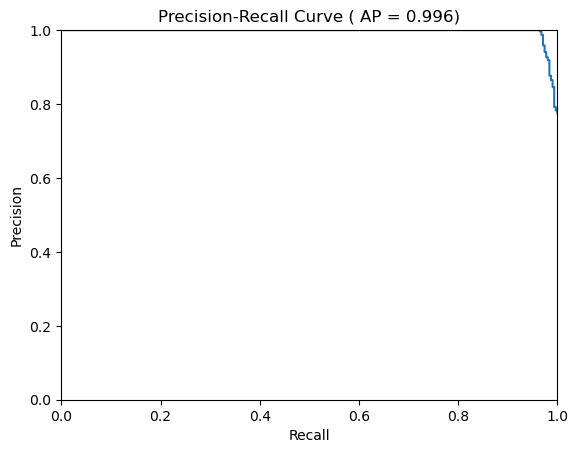

Best threshold (F1): 0.631394946279622
Precision: 0.9966777408637874 Recall: 0.967741935483871 F1: 0.9819967266770778


In [98]:
y_true = Credit["has_bal"].to_numpy()
y_score = creditbin.fittedvalues.to_numpy()

precision, recall, thresholds = precision_recall_curve(y_true, y_score)
ap = average_precision_score(y_true, y_score)

plt.figure()
plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.xlim(0,1)
plt.ylim(0,1)
plt.title(f"Precision-Recall Curve ( AP = {ap:.3f})")
plt.show()

f1 = 2 * (precision[:-1] * recall[:-1])/(precision[:-1] + recall[:-1] + 1e-12)
best_idx = np.argmax(f1)
best_thr = thresholds[best_idx]

print("Best threshold (F1):", best_thr)
print("Precision:", precision[best_idx], "Recall:", recall[best_idx], "F1:", f1[best_idx])

In [99]:
cands = np.quantile(y_score, [0.1, 0.25, 0.5, 0.75, 0.9])
for t in cands:
    pred = (y_score > t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, pred).ravel()
    prec = tp/(tp+fp+1e-12)
    rec  = tp/(tp+fn+1e-12)
    print(t, tp, fp, fn, tn, prec, rec)

0.036398820515331935 307 53 3 37 0.8527777777777753 0.990322580645158
0.6449738693461955 299 1 11 89 0.9966666666666633 0.9645161290322549
0.996660998627563 200 0 110 90 0.999999999999995 0.6451612903225785
0.9999663262123744 100 0 210 90 0.99999999999999 0.32258064516128926
0.9999990481325914 40 0 270 90 0.9999999999999749 0.1290322580645157


In [143]:
from sklearn.metrics import brier_score_loss

y = Credit["has_bal"]
y = np.asarray(y).astype(float)
formula_bin = """
    Income+Limit+Cards+Age+C(Education)+C(Gender)+C(Married)+C(Ethnicity)
"""
x_bin = dmatrix(formula_bin + " - 1", data = Credit, return_type = 'dataframe')
x_train, x_test, y_train, y_test = train_test_split(x_bin, y, test_size = 0.2, random_state = 400)

creditbinmini = sm.GLM(y_train, x_train, family = sm.families.Binomial()).fit()
pred_test = creditbinmini.predict(x_test)
brier = brier_score_loss(y_test, pred_test)

pres2 = creditbinmini.predict(x_test)
pres2 = np.asarray(pres2).astype(float)
pres2 = np.clip(pres2, 1e-12, 1 - 1e-12)
log_pres = np.log(pres2/(1 - pres2))
x = sm.add_constant(log_pres)
fit = sm.GLM(y_test, x, family = sm.families.Binomial()).fit()

intercept = float(fit.params[0])
slope = float(fit.params[1])

print("Brier Score:", brier)
print("Calibration Intercept:", intercept)
print("Calibration Slope:", slope)

Brier Score: 0.024624969029800724
Calibration Intercept: 0.2618775786179383
Calibration Slope: 1.1999366738878519


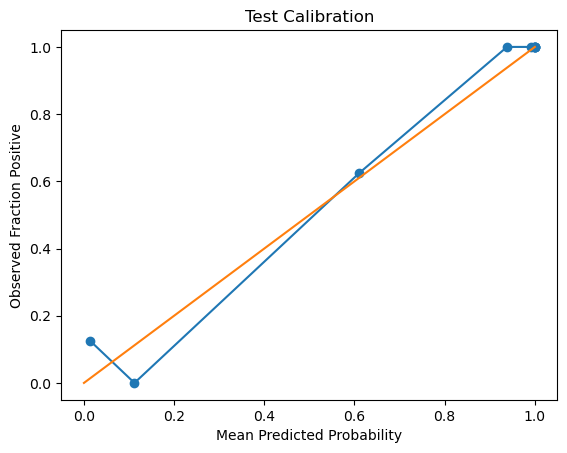

In [144]:
y = y_test.astype(int)
pres3 = creditbinmini.predict(x_test)
pres3 = np.asarray(pres3).astype(float)
frac_pos, mean_pred = calibration_curve(y, pres3, n_bins = 10, strategy = 'quantile')

plt.figure()
plt.plot(mean_pred, frac_pos, marker = 'o')
plt.plot([0, 1], [0, 1])
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Observed Fraction Positive")
plt.title("Test Calibration")
plt.show()

The Precision-Recall curve shows near-perfect separation between classes, with an average precision of .997. Precision remains above 99% across a wide range of recall values, indicating that the model maintains a very low false-positive rate even when aggressively identifying positive cases. This is especially meaningful given class imbalance, where PR-AUC is more informative than ROC-AUC.

Now, we will create a gamma model, which is a tweedie model with powers = 2. This will only use positive balance information. 

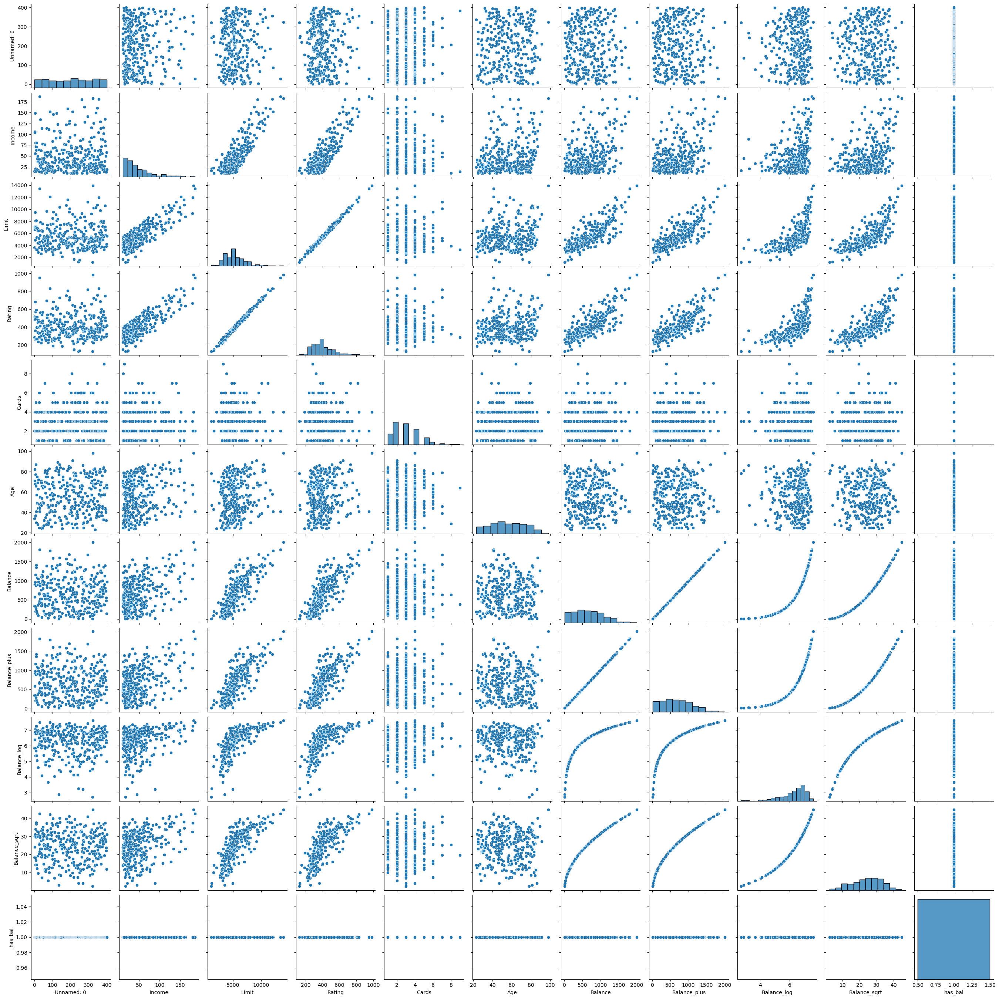

In [102]:
cred = Credit.loc[Credit["Balance"] > 0].copy()

sns.pairplot(cred)
plt.show()

In [103]:
print(cred.describe(include = 'all'))

        Unnamed: 0      Income         Limit      Rating       Cards  \
count   310.000000  310.000000    310.000000  310.000000  310.000000   
unique         NaN         NaN           NaN         NaN         NaN   
top            NaN         NaN           NaN         NaN         NaN   
freq           NaN         NaN           NaN         NaN         NaN   
mean    202.441935   49.978810   5485.467742  405.051613    2.996774   
std     117.373087   37.881628   2052.451743  137.967389    1.426740   
min       1.000000   10.354000   1160.000000  126.000000    1.000000   
25%      98.250000   23.150250   3976.250000  304.000000    2.000000   
50%     209.500000   37.141000   5147.000000  380.000000    3.000000   
75%     306.500000   63.740250   6453.250000  469.000000    4.000000   
max     400.000000  186.634000  13913.000000  982.000000    9.000000   

               Age       Education  Gender Student Married  Ethnicity  \
count   310.000000             310     310     310     310    

In [104]:
creditgam = smf.glm("Balance~Income*np.log(Limit)+bs(Rating, df = 4)+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)", data = cred, family = sm.families.Gamma(sm.families.links.Log())).fit()
print(creditgam.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Balance   No. Observations:                  310
Model:                            GLM   Df Residuals:                      294
Model Family:                   Gamma   Df Model:                           15
Link Function:                    Log   Scale:                        0.062651
Method:                          IRLS   Log-Likelihood:                -1992.2
Date:                Sun, 21 Dec 2025   Deviance:                       25.940
Time:                        20:20:38   Pearson chi2:                     18.4
No. Iterations:                    22   Pseudo R-squ. (CS):             0.9996
Covariance Type:            nonrobust                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

With the exact same variables as the tweedie model, we see that the same variables are significant, but we also see some new ones that now matter. Age seems to now matter. Going from Black to Asian, doesn't matter, but going from Black to White does. Having more than 3 cards also seems to be significant. We also see that our deviance value has dramatically decreased where before it was 8,126 and now it is 26.11. This model is significantly better. Now for the rest of our diagnostics.

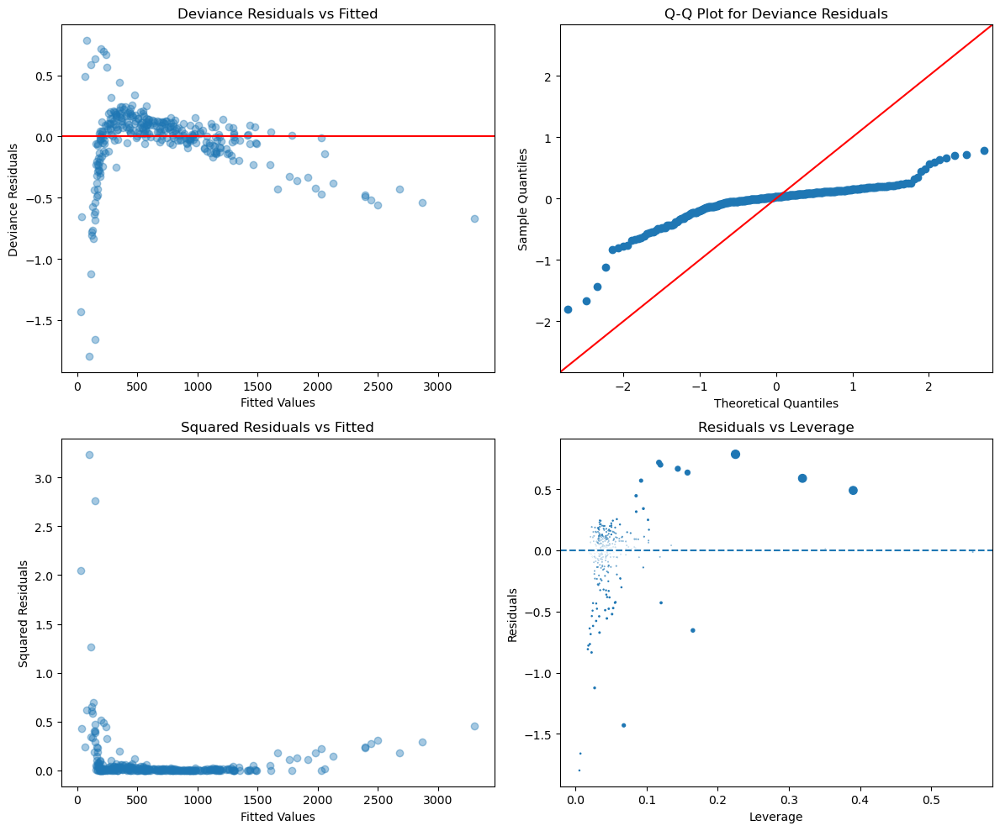

In [105]:
cooks = creditgam.get_influence().cooks_distance[0]
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(creditgam.fittedvalues, creditgam.resid_deviance, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Deviance Residuals")
axes[0,0].set_title("Deviance Residuals vs Fitted")
sm.qqplot(creditgam.resid_deviance, line = '45', ax = axes[0,1])
axes[0,1].set_title("Q-Q Plot for Deviance Residuals")
axes[1,0].scatter(creditgam.fittedvalues, creditgam.resid_deviance**2, alpha  = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Squared Residuals")
axes[1,0].set_title("Squared Residuals vs Fitted")
axes[1,1].scatter(creditgam.get_influence().hat_matrix_diag, creditgam.resid_deviance, s = 50 * cooks/cooks.max())
axes[1,1].axhline(0, linestyle = '--')
axes[1,1].set_xlabel("Leverage")
axes[1,1].set_ylabel("Residuals")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

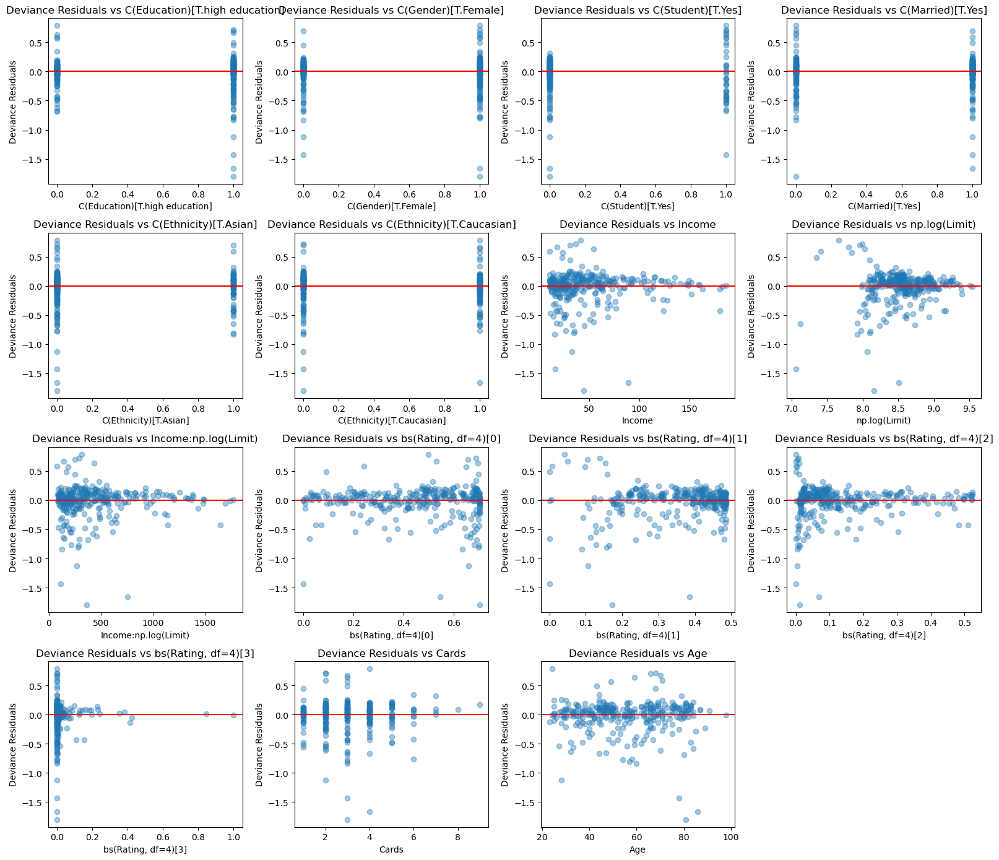

Deviance: 1.0


In [106]:
idsx = [(i, name) for i, name in enumerate(creditgam.model.exog_names) if name.lower() != 'intercept']
n_plots = len(idsx)
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idsx):
    ax.scatter(creditgam.model.exog[:,i], creditgam.resid_deviance, alpha = 0.4)
    ax.axhline(0, color = 'red')
    ax.set_xlabel(name)
    ax.set_ylabel("Deviance Residuals")
    ax.set_title(f"Deviance Residuals vs {name}")

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()
print("Deviance:", scipy.stats.chi2.sf(creditgam.deviance, creditgam.df_resid))                         

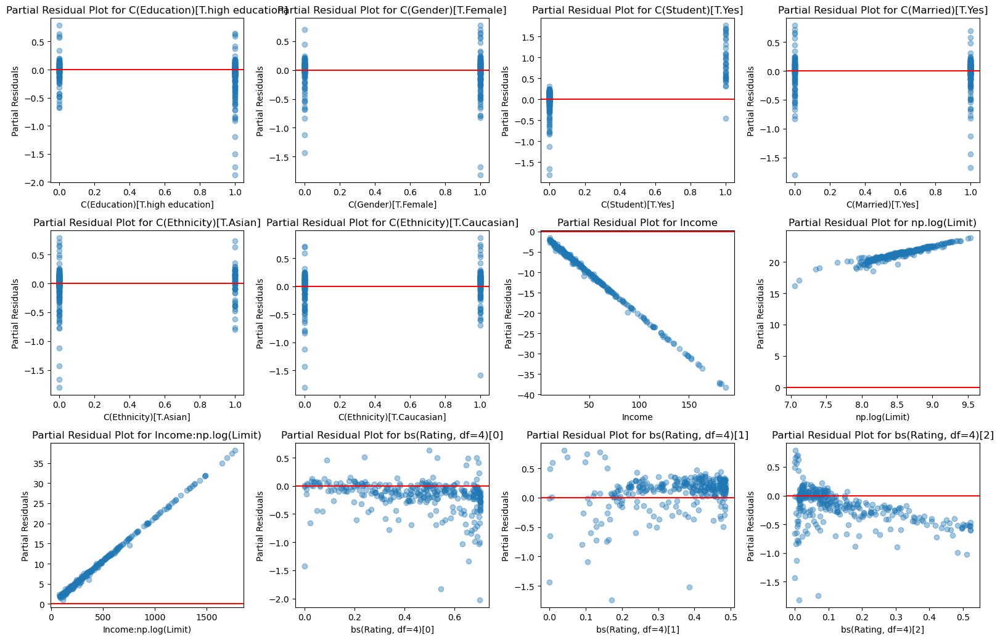

Deviance: 1.0


In [107]:
idsx = [(i, name) for i, name in enumerate(creditgam.model.exog_names) if name.lower() != 'intercept']
n_plots = len(idsx)
n_cols = 4
n_rows = int(n_plots/n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)
for ax, (i, name) in zip(axes, idsx):
    partial_resid = creditgam.model.exog[:,i] * creditgam.params.values[i] + creditgam.resid_deviance
    ax.scatter(creditgam.model.exog[:,i], partial_resid, alpha = 0.4)
    ax.set_xlabel(name)
    ax.set_ylabel("Partial Residuals")
    ax.set_title(f"Partial Residual Plot for {name}")
    ax.axhline(0, color = 'red')

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()
print("Deviance:", scipy.stats.chi2.sf(creditgam.deviance, creditgam.df_resid))

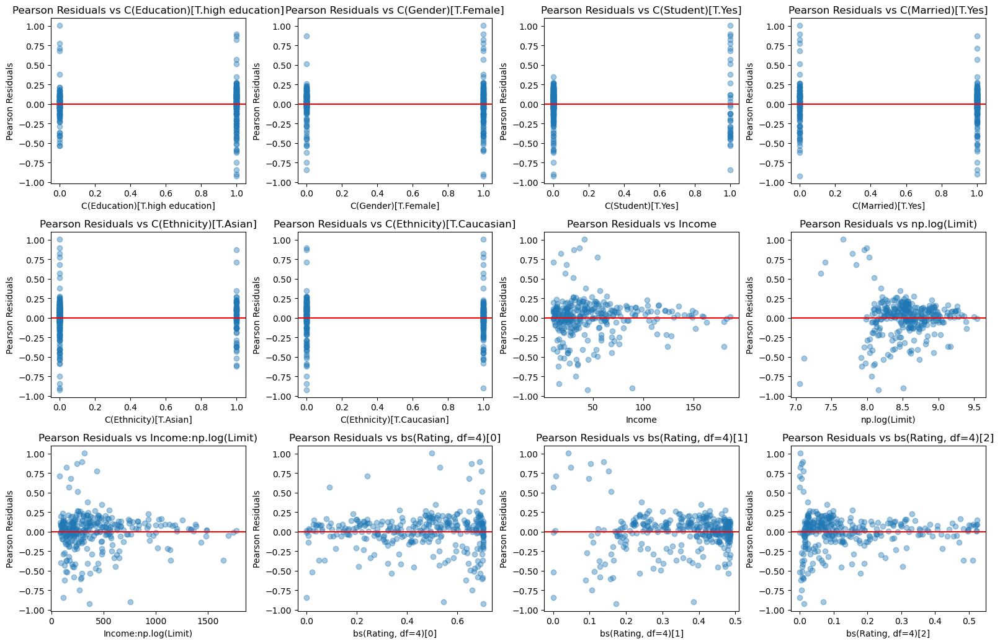

Dispersion value: 0.06265068823807461


In [108]:
idsx = [(i, name) for i, name in enumerate(creditgam.model.exog_names) if name.lower() != 'intercept']
n_plots = len(idsx)
n_cols = 4
n_rows = int(n_plots/n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize = (n_cols * 4, n_rows * 3.5))
axes = np.ravel(axes)

for ax, (i, name) in zip(axes, idsx):
    ax.scatter(creditgam.model.exog[:,i], creditgam.resid_pearson, alpha = 0.4)
    ax.axhline(0, color = 'red')
    ax.set_xlabel(name)
    ax.set_ylabel("Pearson Residuals")
    ax.set_title(f"Pearson Residuals vs {name}")

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

print("Dispersion value:", np.sum(creditgam.resid_pearson**2)/creditgam.df_resid)

In [109]:
X = creditgam.model.exog
vif = pd.DataFrame({"Variable": creditgam.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] > 10])

                Variable           VIF
0              Intercept  46165.508639
7                 Income   3456.168703
8          np.log(Limit)    119.974438
9   Income:np.log(Limit)   3932.301253
10   bs(Rating, df=4)[0]     32.752746
11   bs(Rating, df=4)[1]     47.424831
12   bs(Rating, df=4)[2]     92.461975
13   bs(Rating, df=4)[3]     51.429131


In [110]:
print(creditgam.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
152  0.224982  0.375635        4.550137
218  0.319084  0.345297        3.433613
249  0.390308  0.343415        2.929682
279  0.157543  0.133632        3.381337
101  0.143913  0.132498        3.551180
98   0.117473  0.121346        3.819144
324  0.119541  0.116715        3.708691
242  0.165131  0.063992       -2.275186
320  0.068012  0.055877       -3.500194
35   0.092341  0.052091        2.862224


Our diagnostics look even better than the tweedie. We do not see any trend or obvious curvature in the deviance residuals and even have a deviance score of 1, much better than the 0 we received for the tweedie model. We see that we have no curvature or obvious trends when it comes to the our deviance residuals as well so linearity checks out. Our pearson residual plots show a flat cloud indicating that the variance assumption is met and is supported by dispersion score that is below 1 meaning that we may have overfit our model. Regardless, we can go forward with the summary and interpretations.

In [111]:
print(creditgam.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Balance   No. Observations:                  310
Model:                            GLM   Df Residuals:                      294
Model Family:                   Gamma   Df Model:                           15
Link Function:                    Log   Scale:                        0.062651
Method:                          IRLS   Log-Likelihood:                -1992.2
Date:                Sun, 21 Dec 2025   Deviance:                       25.940
Time:                        20:20:48   Pearson chi2:                     18.4
No. Iterations:                    22   Pseudo R-squ. (CS):             0.9996
Covariance Type:            nonrobust                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [112]:
print(creditgam.wald_test_terms(scalar = True))

                            chi2        P>chi2  df constraint
Intercept              21.267528  3.994410e-06              1
C(Education)            5.783581  1.617655e-02              1
C(Gender)               0.237557  6.259758e-01              1
C(Student)            432.154902  5.519205e-96              1
C(Married)              0.127943  7.205740e-01              1
C(Ethnicity)            5.014141  8.150668e-02              2
Income                 86.011956  1.788510e-20              1
np.log(Limit)          35.142218  3.064838e-09              1
Income:np.log(Limit)   71.419786  2.887618e-17              1
bs(Rating, df=4)       25.806112  3.462456e-05              4
Cards                  11.759635  6.052908e-04              1
Age                     8.996943  2.704316e-03              1


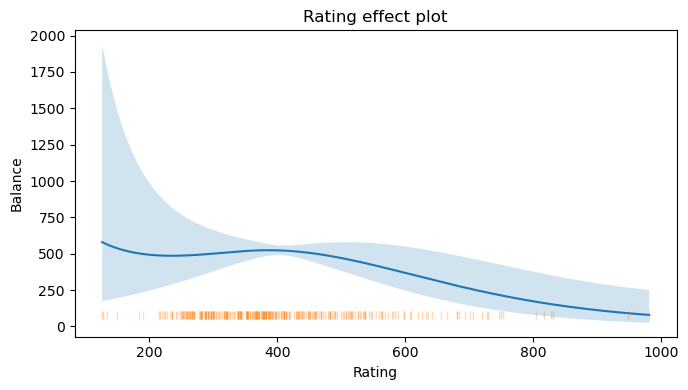

In [113]:
df = cred.copy()

grid = np.linspace(np.min(df["Rating"]), np.max(df["Rating"]), 1000)

df_pred = pd.DataFrame({"Cards": df["Cards"].mean(),
                        "Student": df["Student"].astype("category").mode()[0],
                        "Income": df["Income"].mean(),
                        "Limit": df["Limit"].mean(),
                        "Rating": grid,
                        "Age": df["Age"].mean(),
                        "Education": df["Education"].astype('category').mode()[0],
                        "Gender": df["Gender"].astype('category').mode()[0],
                        "Married": df["Married"].astype('category').mode()[0],
                        "Ethnicity": df["Ethnicity"].astype('category').mode()[0]
                       })

pred_frame = creditgam.get_prediction(df_pred).summary_frame(alpha = 0.05)

plt.figure(figsize = (7,4))
plt.plot(grid, pred_frame["mean"], label = 'Effects of Rating')
plt.fill_between(
            grid,
            pred_frame["mean_ci_lower"],
            pred_frame["mean_ci_upper"],
            alpha = 0.2
)

y_rug = pred_frame["mean"].min() - 0.1
plt.plot(df["Rating"], np.full_like(df["Rating"], y_rug), "|", alpha = 0.3)
plt.xlabel("Rating")
plt.ylabel("Balance")
plt.title("Rating effect plot")
plt.tight_layout()
plt.show()

With the exact same variables as the tweedie model, we see that the same variables are significant, but we also see some new ones that now matter. Age seems to now matter with each 1% increase in age coinciding with a .26% decrease in expected Balance holding all else constant.. Having more than 3 cards also seems to be significant as each level past two cards seems to rise. If you are a student, expect your balance to rise about 97% and for each percentage increase in income, your expected balance will drop by 20%. Every 1% increase in the log of limit coincides with a 2.4% increase in the expected value of Balance. Once again, with the interaction term, it tells us that the higher the income you are, your expected increase in balance for each percentage increase in limit increases.With rating, we are using a cubic basis-spline, visually we can see how that variable behaves. At low values of rating, we have a high variance, but as rating's score increases, we see the variance tighten up, especially at ratings of 400 the balance is around 500. We also see that our deviance value has dramatically decreased where before it was 8,126 and now it is 26.11. This model is significantly better.

We can conclude that our Gamma regression and our hurdle model overall is a significantly better model than the tweedie model due to the structural zeros in the data. However, is it a better model than the linear regressions that we created? Inference wise, there is no doubt that it is better, but the best way to truly confirm which is a better model for prediction purposes is through cross validation. 

The first part of the cross validation, we will compare the full credittrue model to the reduced credittrue3 model, to further see if the larger model is better since we know due to the ANOVA that the larger model was a better model when it came to inferences. Now, we will compare their prediction ability.

In [114]:
df = Credit.copy()
formula = """
    bs(np.log(Income), df = 8, degree = 3, include_intercept = False)
 +  bs(np.log(Limit), df = 8, degree = 3, include_intercept = False)
 +  bs(Rating, df = 4, degree = 3, include_intercept = False)
 +  bs(np.log(Income), df = 8, degree = 3, include_intercept = False)*C(Student)
 +  bs(np.log(Limit), df = 8, degree = 3, include_intercept = False)*C(Student)
 +  Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)
"""

formula_2 = """
    bs(np.log(Income), df = 8, degree = 3, include_intercept = False)
 +  bs(np.log(Limit), df = 8, degree = 3, include_intercept = False)
 +  bs(np.log(Income), df = 8, degree = 3, include_intercept = False)*C(Student)
 +  bs(np.log(Limit), df = 8, degree = 3, include_intercept = False)*C(Student)
 +  C(Student)
"""

formula_bin = """
    Income+Limit+Cards+Age+C(Education)+C(Gender)+C(Married)+C(Ethnicity)
"""

formula_gam = """
    Income*np.log(Limit)+bs(Rating, df = 4)+Cards+Age+C(Education)+C(Gender)+C(Student)+C(Married)+C(Ethnicity)
"""

Y = Credit["Balance_log"]
Y_2 = Credit["has_bal"]
Y_3 = Credit["Balance"]
X = dmatrix(formula + "- 1", data = df, return_type = "dataframe")
X_2 = dmatrix(formula_2 + "-1", data = df, return_type = "dataframe")
X_3 = dmatrix(formula_bin + "-1", data = df, return_type = "dataframe")
X_4 = dmatrix(formula_gam + "-1", data = df, return_type = "dataframe")
X = pd.get_dummies(X, drop_first = True)
X_2 = pd.get_dummies(X_2, drop_first = True)
X_3 = pd.get_dummies(X_3, drop_first = True)
X_4 = pd.get_dummies(X_4, drop_first = True)

In [115]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)
X_train_2, X_test_2, Y_train_2, Y_test_2 = train_test_split(X_2, Y, test_size = 0.2, random_state = 0)

enet_pipe = make_pipeline(
    StandardScaler(with_mean = True, with_std = True),
    ElasticNetCV(l1_ratio = np.arange(0.01, 1.01, 0.01), cv = 10, random_state = 0)
)

nested_score = cross_val_score(enet_pipe, X, Y, cv = 10, scoring = 'r2')
nested_score_2 = cross_val_score(enet_pipe, X_2, Y, cv = 10, scoring = 'r2')
mean_squared_error = cross_val_score(enet_pipe, X, Y, cv = 10, scoring = 'neg_mean_squared_error')
mean_squared_error_2 = cross_val_score(enet_pipe, X_2, Y, cv = 10, scoring = 'neg_mean_squared_error')

print("Nested CV R^2:", nested_score.mean())
print("Nested_2 CV R^2:", nested_score_2.mean())
print("MSE:", -mean_squared_error.mean())
print("MSE_2:", -mean_squared_error_2.mean())

enet_pipe.fit(X_train,Y_train)
enet_cv = enet_pipe.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv.coef_, index = X.columns)
tol = 1e-6
enet_results = pd.DataFrame({"Coefficient": coef,
                              "Selected": coef.abs() > tol})

print("Best Alpha:", enet_cv.alpha_)
print("Best l1_ratio:", enet_cv.l1_ratio_)
print("Hold-out score:", enet_pipe.score(X_test, Y_test))
print("Chosen:", enet_results[enet_results["Selected"] == True])
print("Neglected:", enet_results[enet_results["Selected"] == False])

Nested CV R^2: 0.9337758300814301
Nested_2 CV R^2: 0.9337779192026938
MSE: 0.21383464846379105
MSE_2: 0.21110004893569068
Best Alpha: 0.0016558042395795512
Best l1_ratio: 1.0
Hold-out score: 0.946073437426
Chosen:                                                     Coefficient  Selected
C(Gender)[T.Female]                                   -0.031415      True
C(Married)[T.Yes]                                      0.023539      True
C(Ethnicity)[T.Asian]                                  0.004000      True
C(Ethnicity)[T.Caucasian]                              0.038470      True
bs(np.log(Income), df=8, degree=3, include_inte...     0.046657      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.054716      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.045754      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.177659      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.264838      True
bs(np.log(Income), df=8, degree=3, include_int

In [116]:
enet_pipe.fit(X_train_2,Y_train_2)
enet_cv = enet_pipe.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv.coef_, index = X_2.columns)
tol = 1e-6
enet_results = pd.DataFrame({"Coefficient": coef,
                              "Selected": coef.abs() > tol})

print("Best Alpha:", enet_cv.alpha_)
print("Best l1_ratio:", enet_cv.l1_ratio_)
print("Hold-out score:", enet_pipe.score(X_test_2, Y_test_2))
print("Chosen:", enet_results[enet_results["Selected"] == True])
print("Neglected:", enet_results[enet_results["Selected"] == False])

Best Alpha: 0.0014401340859046127
Best l1_ratio: 1.0
Hold-out score: 0.9457513644551261
Chosen:                                                     Coefficient  Selected
C(Student)[No]                                        -0.037944      True
bs(np.log(Income), df=8, degree=3, include_inte...     0.071301      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.074043      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.050399      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.175281      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.291755      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.410401      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.398735      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.391386      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.029864      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.007633      True
bs(np.log(Income

In [117]:
outer = KFold(n_splits = 10, shuffle = True, random_state = 0)

enet_pipe_2 = make_pipeline(
    StandardScaler(with_mean = True, with_std = True),
    ElasticNetCV(l1_ratio = np.arange(0.01, 1.01, 0.01), cv = 10, random_state = 0)
)

nested_score = cross_val_score(enet_pipe_2, X, Y, cv = outer, scoring = 'r2')
nested_score_2 = cross_val_score(enet_pipe_2, X_2, Y, cv = outer, scoring = 'r2')
mean_squared_error = cross_val_score(enet_pipe_2, X, Y, cv = outer, scoring = 'neg_mean_squared_error')
mean_squared_error_2 = cross_val_score(enet_pipe_2, X_2, Y, cv = outer, scoring = 'neg_mean_squared_error')

print("Nested CV R^2:", nested_score.mean())
print("Nested CV R^2:", nested_score_2.mean())
print("MSE:", -mean_squared_error.mean())
print("MSE:", -mean_squared_error_2.mean())

enet_pipe_2.fit(X, Y)
enet_cv_2 = enet_pipe_2.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv_2.coef_, index = X.columns)
tol = 1e-6
enet2_results = pd.DataFrame({"Coefficient": coef,
                              "Selected": coef.abs() > tol})

print("Best Alpha:", enet_cv_2.alpha_)
print("Best l1_ratio:", enet_cv_2.l1_ratio_)
print("Chosen:", enet2_results[enet2_results["Selected"] == True])
print("Neglected:", enet2_results[enet2_results["Selected"] == False])

Nested CV R^2: 0.936372907580196
Nested CV R^2: 0.9362388015030373
MSE: 0.207501023133181
MSE: 0.20722829965516265
Best Alpha: 0.0015544781740139744
Best l1_ratio: 0.9500000000000001
Chosen:                                                     Coefficient  Selected
C(Student)[No]                                        -0.023633      True
C(Student)[Yes]                                        0.003275      True
C(Education)[T.high education]                        -0.006256      True
C(Gender)[T.Female]                                   -0.021931      True
C(Married)[T.Yes]                                      0.004928      True
C(Ethnicity)[T.Asian]                                  0.020986      True
C(Ethnicity)[T.Caucasian]                              0.045681      True
bs(np.log(Income), df=8, degree=3, include_inte...     0.008391      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.027175      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.073739      

In [118]:
enet_pipe_2.fit(X_2, Y)
enet_cv_2 = enet_pipe_2.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv_2.coef_, index = X_2.columns)
tol = 1e-6
enet2_results = pd.DataFrame({"Coefficient": coef,
                              "Selected": coef.abs() > tol})

print("Best Alpha:", enet_cv_2.alpha_)
print("Best l1_ratio:", enet_cv_2.l1_ratio_)
print("Chosen:", enet2_results[enet2_results["Selected"] == True])
print("Neglected:", enet2_results[enet2_results["Selected"] == False])

Best Alpha: 0.0014767542653132757
Best l1_ratio: 1.0
Chosen:                                                     Coefficient  Selected
C(Student)[No]                                        -0.017544      True
bs(np.log(Income), df=8, degree=3, include_inte...     0.026439      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.043555      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.076303      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.171527      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.299234      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.397390      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.381417      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.370849      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.020811      True
bs(np.log(Income), df=8, degree=3, include_inte...    -0.019831      True
bs(np.log(Income), df=8, degree=3, include_inte... 

We can see that the more complex model, the credittrue one, barely outperformed the more simpler model. In one instance, the simpler model actually performed better when it came to scoring on 1 hold out sample. However, both the ANOVA and the cross validation metrics tell us to go with the more complex linear regression model. We also see that the best regularization parameter says to use a full lasso model. Now, to compare the linear regression model with our GAMMA-Hurdle model.

In [119]:
from sklearn.metrics import mean_squared_error as mse
kf = KFold(n_splits = 10, shuffle = True)

rmse_hurdle = []
rmse_linear = [] 

for train_idx, test_idx in kf.split(df):
    Xlin_tr, Xlin_te = X.iloc[train_idx], X.iloc[test_idx]
    Ylin_tr, Ylin_te = Y.iloc[train_idx], Y_3.iloc[test_idx]

    lin = enet_pipe.fit(Xlin_tr, Ylin_tr)
    yhat_lin = lin.predict(Xlin_te)
    yhat_lin = np.exp(yhat_lin)
    rmse_linear.append(
    np.sqrt(mse(Ylin_te, yhat_lin))
    )


    Xbin_tr, Xbin_te = X_3.iloc[train_idx], X_3.iloc[test_idx]
    Ybin_tr, Ybin_te = Y_2.iloc[train_idx], Y_2.iloc[test_idx]
    Xgam_tr, Xgam_te = X_4.iloc[train_idx], X_4.iloc[test_idx]
    Ygam_tr, Ygam_te = Y_3.iloc[train_idx], Y_3.iloc[test_idx]

    
    creditbin = sm.GLM(Ybin_tr, Xbin_tr , family = sm.families.Binomial()).fit()

    pos_mask = (Ygam_tr > 0)
    
    creditgam = sm.GLM(Ygam_tr.loc[pos_mask],
                       Xgam_tr.loc[pos_mask], 
                      family = sm.families.Gamma(sm.families.links.Log())
                      ).fit()

    p_pos = creditbin.predict(Xbin_te)
    mu_pos = creditgam.predict(Xgam_te)
    yhat_hurdle = p_pos * mu_pos

    rmse_hurdle.append(
        np.sqrt(mse(Ygam_te, yhat_hurdle))
    )

print("RMSE Linear:", np.mean(rmse_linear))
print("RMSE Hurdle:", np.mean(rmse_hurdle))

RMSE Linear: 332.7505030352666
RMSE Hurdle: 194.9188226133629


We see that when comparing our linear model with the hurdle model, the hurdle model predicts much much better. But, this doesn't tell the full story in regards to how each model is measured. The linear model is designed to optimize in RMSE, where else the GAMMA regression optimizes on likelihood. The metric we are using is not fair as OLS averages on zeros and positives, shrinking predictions toward the mean, this behavior alone reduces squared error where else our Hurdle model explicitly models zeros. A hurdle mode would have to be measured under a metric that measures deviance instead, however that would give the hurdle an advantage because it would correct model the zero inflation and skewed conditional distribution.

The overall key take away we can say, for prediction, the regularized hurdle model performs best. For inference, a hurdle model with a binomial and gamma component better reflects the data generating process and provides interpretable effects as well.